### Importing all the important libraries

In [ ]:
import pathlib
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import cv2
import string
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
import tensorflow.keras.backend as K
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional,Dropout
from tensorflow.compat.v1.keras.layers import CuDNNLSTM,CuDNNGRU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical, Sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tqdm import tqdm
from itertools import groupby

In [ ]:
import glob
import os
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
len(os.listdir("/content/drive/MyDrive/ALPR_Data/Detect_All/"))

1782

In [ ]:
import glob
from PIL import Image

### EDA

In [ ]:
data_dir_image ="/content/drive/MyDrive/ALPR_Data/Images_All/"
bb_dir_path = "/content/drive/MyDrive/ALPR_Data/Detect_All/"
data_dir_recog ="/content/drive/MyDrive/ALPR_Data/Recog_All/"

In [ ]:
  img = tf.io.read_file("/content/drive/MyDrive/ALPR_Data/Images_All/AC_192.jpg")
  img = tf.io.decode_image(img)

In [ ]:
#lambda x: tf.py_func(load_audio_file, [x], [tf.string]))

def get_bb_box_python(image_file):
  bb_filepath = os.path.join(bb_dir_path,os.path.basename(image_file).replace(".jpg",".txt"))
  #print(bb_filepath)
  with open (bb_filepath) as f:
    bb_box = list(map(int,[float(x.strip().strip(b'\x00'.decode())) for x in f.readlines()]))
    #print(bb_box)
    offset_height, offset_width, target_height, target_width = bb_box[1], bb_box[0], bb_box[3]-bb_box[1] , bb_box[2]-bb_box[0]
    return offset_height, offset_width, target_height, target_width

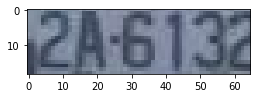

In [ ]:
offset_height, offset_width, target_height, target_width = get_bb_box_python('/content/drive/MyDrive/ALPR_Data/Images_All/AC_192.jpg')
plate_img = tf.image.crop_to_bounding_box(img, offset_height, offset_width, target_height, target_width)
#cv2_imshow(plate_img.numpy())
plt.figure(figsize=(4, 3))
plt.imshow(plate_img.numpy())

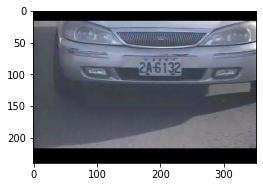

In [ ]:
plt.figure(figsize=(4, 6))
plt.imshow(img.numpy())

In [ ]:
img = tf.image.crop_to_bounding_box(img, offset_height, offset_width, target_height, target_width)

In [ ]:
img.numpy().shape

(240, 320, 3)

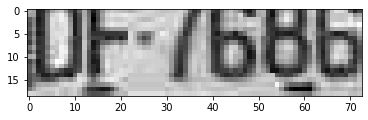

In [ ]:
plt.imshow(cropped_img.numpy()[:,:,0],cmap='gray')

In [ ]:
img_f = glob.glob(data_dir_image+'*.jpg')
im_h =[]
im_w =[]
for im in img_f:
  img=plt.imread(im)
  im_h .append(img.shape[0])
  im_w .append(img.shape[1])

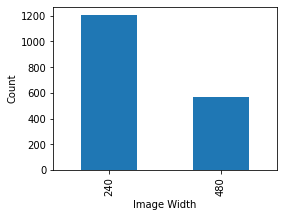

In [ ]:
plt.figure(figsize=(4, 3))
pd.Series(im_h).value_counts().plot(kind='bar', xlabel = "Image Width", ylabel = "Count")

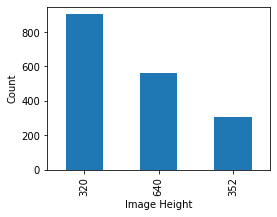

In [ ]:
plt.figure(figsize=(4, 3))
pd.Series(im_w).value_counts().plot(kind='bar', xlabel = "Image Height", ylabel = "Count")

In [ ]:
#lambda x: tf.py_func(load_audio_file, [x], [tf.string]))

def get_bb_box(image_file):
  bb_filepath = os.path.join(bb_dir_path,os.path.basename(image_file.numpy().decode('utf-8')).replace(".jpg",".txt"))
  #print(bb_filepath)
  with open (bb_filepath) as f:
    bb_box = list(map(int,[float(x.strip().strip(b'\x00'.decode())) for x in f.readlines()]))
    #print(bb_box)
    offset_height, offset_width, target_height, target_width = bb_box[1], bb_box[0], bb_box[3]-bb_box[1] , bb_box[2]-bb_box[0]
    return offset_height, offset_width, target_height, target_width

In [ ]:
## CHECKING MIS LABELLING

dir ="/content/drive/MyDrive/ALPR_Data/Images_All/"
img_f = glob.glob(dir+'*')
mis_labelled = []
cnt = 0
for f in img_f:
  try: 
    tf_f = tf.constant(f)
    bb = get_bb_box(tf_f)
    #print(bb)
    if bb[3]<0 or bb[2]<0:
      #print(f)
      cnt+=1
      mis_labelled.append(f)
      #print(bb)
  except:
    continue
print(cnt)
mis_labelled[:5]

250


['/content/drive/MyDrive/ALPR_Data/Images_All/RP_326.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_300.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_302.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_334.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_312.jpg']

In [ ]:
## TO DO 

In [ ]:
#dir ="/content/drive/MyDrive/ALPR_Data/Detect_All/"
#cust_dir = "/content/drive/MyDrive/ALPR_Data/Images_All/"
milabl_dir = "/content/drive/MyDrive/ALPR_Data/Mislabelled/"


#data_dir_image ="/content/drive/MyDrive/ALPR_Data/Images_All/"
#bb_dir_path = "/content/drive/MyDrive/ALPR_Data/Detect_All/"
#data_dir_recog ="/content/drive/MyDrive/ALPR_Data/Recog_All/"
img_f = glob.glob(bb_dir_path+'*')
mis_labelled_src =[]
mis_labelled_dest =[]
mis_labelled_image =[]
mis_labelled_detect =[]
mis_labelled_recog =[]
cnt = 0
for f in img_f:
  try:
    with open(f,'r') as myfile:
      coord = [int(float(x.strip())) for x in myfile.readlines()]
      
      if (coord[0]> coord[2]) or (coord[1]> coord[3]) :
      #print(f)
        cnt+=1
        mis_labelled_src.append(data_dir_image+os.path.basename(f))
        mis_labelled_src.append(data_dir_image+(os.path.basename(f).replace(".txt",".jpg")))
        mis_labelled_dest.append(milabl_dir+os.path.basename(f))
        mis_labelled_dest.append(milabl_dir+(os.path.basename(f).replace(".txt",".jpg")))

        mis_labelled_image.append(data_dir_image+os.path.basename(f).replace(".txt",".jpg"))
        mis_labelled_detect.append(bb_dir_path+os.path.basename(f))
        mis_labelled_recog.append(data_dir_recog+os.path.basename(f))
      #print(bb)
  except:
    print(f)
    continue
print(cnt)
print(mis_labelled_image[:5])
print(mis_labelled_detect[:5])
print(mis_labelled_recog[:5])


250
['/content/drive/MyDrive/ALPR_Data/Images_All/RP_117.jpg', '/content/drive/MyDrive/ALPR_Data/Images_All/RP_135.jpg', '/content/drive/MyDrive/ALPR_Data/Images_All/RP_121.jpg', '/content/drive/MyDrive/ALPR_Data/Images_All/RP_110.jpg', '/content/drive/MyDrive/ALPR_Data/Images_All/RP_109.jpg']
['/content/drive/MyDrive/ALPR_Data/Detect_All/RP_117.txt', '/content/drive/MyDrive/ALPR_Data/Detect_All/RP_135.txt', '/content/drive/MyDrive/ALPR_Data/Detect_All/RP_121.txt', '/content/drive/MyDrive/ALPR_Data/Detect_All/RP_110.txt', '/content/drive/MyDrive/ALPR_Data/Detect_All/RP_109.txt']
['/content/drive/MyDrive/ALPR_Data/Recog_All/RP_117.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_135.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_121.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_110.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_109.txt']


In [ ]:
img_f = glob.glob(bb_dir_path+'*')
height =[]
width  =[]
cnt = 0
for f in img_f:
  try:
    with open(f,'r') as myfile:
      coord = [int(float(x.strip())) for x in myfile.readlines()]
      height.append(coord[3]-coord[1])
      width.append(coord[2]-coord[0])
      #if coord[3]-coord[1] < 20 or coord[2]-coord[0]<50:
        #print(os.path.basename(f))
  except:
    continue
print(max(height))
print(max(width))
print(min(height))
print(min(width))

89
167
5
38


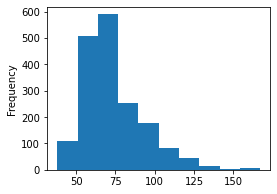

In [ ]:
plt.figure(figsize=(4, 3))
pd.Series(width).plot(kind ='hist',xlabel = "Plate Width", ylabel = "Count")

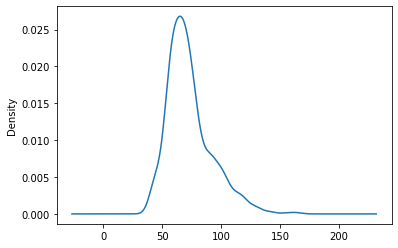

In [ ]:
pd.Series(width).plot(kind='kde')

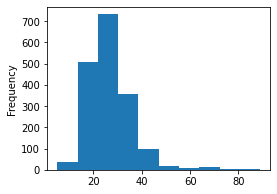

In [ ]:
plt.figure(figsize=(4, 3))
pd.Series(height).plot(kind ='hist',xlabel = "Plate_Height", ylabel = "Count")

In [ ]:
print(mis_labelled_src[:5])

['/content/drive/MyDrive/ALPR_Data/Images_All/RP_117.txt', '/content/drive/MyDrive/ALPR_Data/Images_All/RP_117.jpg', '/content/drive/MyDrive/ALPR_Data/Images_All/RP_135.txt', '/content/drive/MyDrive/ALPR_Data/Images_All/RP_135.jpg', '/content/drive/MyDrive/ALPR_Data/Images_All/RP_121.txt']


In [ ]:
len(mis_labelled_src)

500

In [ ]:
for source,dest in zip(mis_labelled_src,mis_labelled_dest):
    os.rename(source , dest)

In [ ]:
for mislabl_files in mis_labelled_image:
    os.remove(mislabl_files)

In [ ]:
for mislabl_files in mis_labelled_detect:
    os.remove(mislabl_files)

In [ ]:
for mislabl_files in mis_labelled_recog:
    os.remove(mislabl_files)

In [ ]:
len(os.listdir(data_dir_image))

1774

In [ ]:
len(os.listdir(bb_dir_path)) #additional 8 mislablleing

1782

In [ ]:
len(os.listdir(data_dir_recog))

1782

In [ ]:
def randseed():
  return 0.54

### Creating Train and Validation File paths for all Categories

In [ ]:
import random 
images_files = glob.glob(data_dir_image+'*.jpg')
#images_files = [x for x in images_files if x not in mis_labelled]
random.Random(4).shuffle(images_files )
#images_files.sort( key = lambda x : int(os.path.basename(x)[3:-4]))
train_image_files = images_files[:int(len(images_files)*0.8)]
val_image_files = images_files[int(len(images_files)*0.8):]

In [ ]:
val_image_files_AC = [x for x in val_image_files if 'AC_' in x]
print(len(val_image_files_AC))
val_image_files_AC[:5]

118


['/content/drive/MyDrive/ALPR_Data/Images_All/AC_442.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_643.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_397.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_370.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_361.jpg']

In [ ]:
val_image_files_LE = [x for x in val_image_files if 'LE_' in x]
print(len(val_image_files_LE))
val_image_files_LE[:5]

170


['/content/drive/MyDrive/ALPR_Data/Images_All/LE_24.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/LE_340.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/LE_694.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/LE_717.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/LE_678.jpg']

In [ ]:
val_image_files_RP = [x for x in val_image_files if 'RP_' in x]
print(len(val_image_files_RP))
val_image_files_RP[:5]

67


['/content/drive/MyDrive/ALPR_Data/Images_All/RP_131.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_449.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_32.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_588.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_469.jpg']

In [ ]:
train_image_files[:5]

['/content/drive/MyDrive/ALPR_Data/Images_All/LE_685.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_136.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_518.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_242.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_525.jpg']

In [ ]:
val_image_files[:5]

['/content/drive/MyDrive/ALPR_Data/Images_All/AC_442.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_643.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/RP_131.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/LE_24.jpg',
 '/content/drive/MyDrive/ALPR_Data/Images_All/AC_397.jpg']

In [ ]:
label_files = [data_dir_recog + os.path.basename(x).replace(".jpg", ".txt") for x in images_files]
label_files[:5]
#label_files.sort( key = lambda x : int(os.path.basename(x)[:-4]))

['/content/drive/MyDrive/ALPR_Data/Recog_All/LE_685.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_136.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_518.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_242.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_525.txt']

In [ ]:
train_label_files = [data_dir_recog + os.path.basename(x).replace(".jpg", ".txt") for x in train_image_files]
val_label_files = [data_dir_recog + os.path.basename(x).replace(".jpg", ".txt") for x in val_image_files]
print(train_label_files[:5])
print(val_label_files[:5])

['/content/drive/MyDrive/ALPR_Data/Recog_All/LE_685.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_136.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_518.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_242.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_525.txt']
['/content/drive/MyDrive/ALPR_Data/Recog_All/AC_442.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_643.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_131.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/LE_24.txt', '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_397.txt']


In [ ]:
val_label_files_AC = [x for x in val_label_files if 'AC_' in x]
val_label_files_AC[:5]

['/content/drive/MyDrive/ALPR_Data/Recog_All/AC_442.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_643.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_397.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_370.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/AC_361.txt']

In [ ]:
val_label_files_LE = [x for x in val_label_files if 'LE_' in x]
val_label_files_LE[:5]

['/content/drive/MyDrive/ALPR_Data/Recog_All/LE_24.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/LE_340.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/LE_694.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/LE_717.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/LE_678.txt']

In [ ]:
val_label_files_RP = [x for x in val_label_files if 'RP_' in x]
val_label_files_RP[:5]

['/content/drive/MyDrive/ALPR_Data/Recog_All/RP_131.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_449.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_32.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_588.txt',
 '/content/drive/MyDrive/ALPR_Data/Recog_All/RP_469.txt']

In [ ]:
label_list =[]
for filename in label_files:
  with open(filename) as f:
      label_list.append( [x.strip().strip(b'\x00'.decode()) for x in f.readlines() if x.strip().strip(b'\x00'.decode()) !=''] )
label_list[:5]

[['S', '6', '6', '2', '0', '2'],
 ['9', '5', '5', '3', 'K', 'D'],
 ['C', 'H', '6', '0', '8', '8'],
 ['T', '4', '1', '5', '7', '7'],
 ['3', '2', '0', '6', 'T', 'W']]

In [ ]:
train_label_list =[]
for filename in train_label_files:
  with open(filename) as f:
      train_label_list.append( [x.strip().strip(b'\x00'.decode()) for x in f.readlines() if x.strip().strip(b'\x00'.decode()) !=''] )
train_label_list[:5]

[['S', '6', '6', '2', '0', '2'],
 ['9', '5', '5', '3', 'K', 'D'],
 ['C', 'H', '6', '0', '8', '8'],
 ['T', '4', '1', '5', '7', '7'],
 ['3', '2', '0', '6', 'T', 'W']]

In [ ]:
val_label_list =[]
for filename in val_label_files:
  with open(filename) as f:
      val_label_list.append( [x.strip().strip(b'\x00'.decode()) for x in f.readlines() if x.strip().strip(b'\x00'.decode()) !=''] )
val_label_list[:5]

[['7', '2', '6', '5', 'Q', 'G'],
 ['7', 'N', '9', '7', '9', '0'],
 ['7', 'R', '2', '0', '1', '9'],
 ['C', 'U', '4', '8', '7', '5'],
 ['6', '7', '9', '9', 'L', 'U']]

In [ ]:
val_label_list_AC =[]
for filename in val_label_files_AC:
  with open(filename) as f:
      val_label_list_AC.append( [x.strip().strip(b'\x00'.decode()) for x in f.readlines() if x.strip().strip(b'\x00'.decode()) !=''] )
val_label_list_AC[:5]

[['7', '2', '6', '5', 'Q', 'G'],
 ['7', 'N', '9', '7', '9', '0'],
 ['6', '7', '9', '9', 'L', 'U'],
 ['U', '4', '1', '2', '8', '8'],
 ['G', 'R', '4', '5', '2', '2']]

In [ ]:
val_label_list_LE =[]
for filename in val_label_files_LE:
  with open(filename) as f:
      val_label_list_LE.append( [x.strip().strip(b'\x00'.decode()) for x in f.readlines() if x.strip().strip(b'\x00'.decode()) !=''] )
val_label_list_LE[:5]

[['C', 'U', '4', '8', '7', '5'],
 ['1', '6', '9', '2', 'D', 'P'],
 ['U', 'R', '1', '2', '6', '3'],
 ['R', '0', '7', '9', '7', '9'],
 ['N', '3', '9', '8', '7', '8']]

In [ ]:
val_label_list_RP =[]
for filename in val_label_files_RP:
  with open(filename) as f:
      val_label_list_RP.append( [x.strip().strip(b'\x00'.decode()) for x in f.readlines() if x.strip().strip(b'\x00'.decode()) !=''] )
val_label_list_RP[:5]

[['7', 'R', '2', '0', '1', '9'],
 ['2', 'L', '1', '3', '3', '6'],
 ['5', 'B', '7', '0', '3', '6'],
 ['R', '2', '8', '2', '8', '6'],
 ['3', '8', '5', '2', 'H', 'G']]

In [ ]:
char_list_full =[]
for x in label_list:
  char_list_full.extend(x) 
char_list = sorted(list(set(char_list_full)))
char_list

['0',
 '1',
 '2',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9',
 'A',
 'B',
 'C',
 'D',
 'E',
 'F',
 'G',
 'H',
 'J',
 'K',
 'L',
 'M',
 'N',
 'O',
 'P',
 'Q',
 'R',
 'S',
 'T',
 'U',
 'V',
 'W',
 'X',
 'Y',
 'Z']

In [ ]:
len(char_list)

35

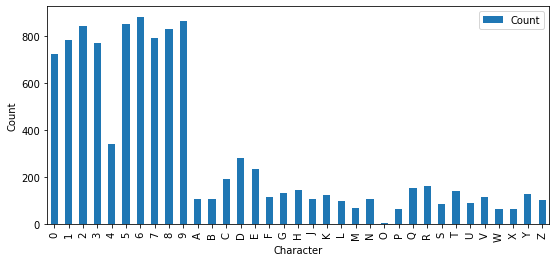

In [ ]:
pd.DataFrame({x:char_list_full.count(x) for x in char_list}.items(), columns =['Char', 'Count']).plot(kind='bar', x= 'Char', y ='Count' , figsize=(9,4),xlabel = "Character", ylabel = "Count")

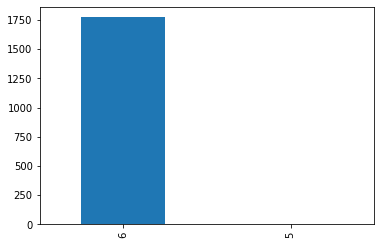

In [ ]:
pd.Series([len(text) for text in label_list]).value_counts().plot(kind='bar')

In [ ]:
char_list.append('35') #why

In [ ]:
batch_size = 32
img_height = 32
img_width = 128

In [ ]:
max_label_len = max([len(text) for text in label_list])
print(max_label_len)
#label_list

6


In [ ]:
# Label Encoder function with Padding
def encode_to_labels(txt):
    # encoding each output word into digits
    label_lst = []
    
    for index, char in enumerate(txt):
        try:
            label_lst.append(char_list.index(char))
        except:
            print(char)
    
    return pad_sequences([label_lst], maxlen=max_label_len, padding='post', value=len(char_list))[0]

In [ ]:
padded_labels = list(map(encode_to_labels, label_list))

#padded_labels

In [ ]:
padded_train_labels= list(map(encode_to_labels, train_label_list))
print(padded_train_labels[:5])
padded_val_labels= list(map(encode_to_labels, val_label_list))
print(padded_val_labels[:5])

[array([27,  6,  6,  2,  0,  2], dtype=int32), array([ 9,  5,  5,  3, 19, 13], dtype=int32), array([12, 17,  6,  0,  8,  8], dtype=int32), array([28,  4,  1,  5,  7,  7], dtype=int32), array([ 3,  2,  0,  6, 28, 31], dtype=int32)]
[array([ 7,  2,  6,  5, 25, 16], dtype=int32), array([ 7, 22,  9,  7,  9,  0], dtype=int32), array([ 7, 26,  2,  0,  1,  9], dtype=int32), array([12, 29,  4,  8,  7,  5], dtype=int32), array([ 6,  7,  9,  9, 20, 29], dtype=int32)]


In [ ]:
[list(x) for x in padded_train_labels[:5]]

[[30, 13, 3, 4, 4, 1],
 [2, 2, 7, 7, 32, 33],
 [26, 14, 9, 3, 0, 2],
 [11, 11, 3, 5, 1, 9],
 [5, 13, 5, 2, 5, 9]]

In [ ]:
padded_val_labels_AC= list(map(encode_to_labels, val_label_list_AC))
print(padded_val_labels_AC[:5])
padded_val_labels_LE= list(map(encode_to_labels, val_label_list_LE))
print(padded_val_labels_LE[:5])
padded_val_labels_RP= list(map(encode_to_labels, val_label_list_RP))
print(padded_val_labels_RP[:5])

[array([ 7,  2,  6,  5, 25, 16], dtype=int32), array([ 7, 22,  9,  7,  9,  0], dtype=int32), array([ 6,  7,  9,  9, 20, 29], dtype=int32), array([29,  4,  1,  2,  8,  8], dtype=int32), array([16, 26,  4,  5,  2,  2], dtype=int32)]
[array([12, 29,  4,  8,  7,  5], dtype=int32), array([ 1,  6,  9,  2, 13, 24], dtype=int32), array([29, 26,  1,  2,  6,  3], dtype=int32), array([26,  0,  7,  9,  7,  9], dtype=int32), array([22,  3,  9,  8,  7,  8], dtype=int32)]
[array([ 7, 26,  2,  0,  1,  9], dtype=int32), array([ 2, 20,  1,  3,  3,  6], dtype=int32), array([ 5, 11,  7,  0,  3,  6], dtype=int32), array([26,  2,  8,  2,  8,  6], dtype=int32), array([ 3,  8,  5,  2, 17, 16], dtype=int32)]


In [ ]:
[char_list[x] for x in padded_train_labels[0]]

['V', '8', '1', '0', '4', '1']

### TF Dataset Creation

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((train_image_files,padded_train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_image_files,padded_val_labels))

In [ ]:
val_dataset_AC = tf.data.Dataset.from_tensor_slices((val_image_files_AC,padded_val_labels_AC))
val_dataset_LE = tf.data.Dataset.from_tensor_slices((val_image_files_LE,padded_val_labels_LE))
val_dataset_RP = tf.data.Dataset.from_tensor_slices((val_image_files_RP,padded_val_labels_RP))

In [ ]:
min([len(x) for x in padded_val_labels])

6

### Pre-Processing Functions for Both Architecture

In [ ]:
def preprocess_data(image_file, label):
  img = tf.io.read_file(image_file)
  img = tf.io.decode_image(img)
  #bb_base_path = "/content/drive/MyDrive/ALPR_Data/groundtruth_localization"
  #bb_filepath = os.path.join(bb_base_path,os.path.basename(image_file.numpy().decode('utf-8'))[3:].replace(".jpg",".txt"))
  #print(bb_filepath)
  #with open (bb_filepath) as f:
    #bb_box = list(map(int,[x.strip().strip(b'\x00'.decode()) for x in f.readlines()]))
    #print(bb_box)
    #offset_height, offset_width, target_height, target_width = bb_box[1], bb_box[0], bb_box[3]-bb_box[1] , bb_box[2]-bb_box[0]
    #print(offset_height, offset_width, target_height, target_width)

  offset_height, offset_width, target_height, target_width = tf.py_function(get_bb_box, [image_file], [tf.int32,tf.int32,tf.int32,tf.int32]) 
      
  #img = tf.image.crop_to_bounding_box(img, offset_height, offset_width, target_height, target_width )
  img = tf.image.crop_to_bounding_box(img, offset_height, offset_width, target_height, target_width)
  img = tf.cast(img, tf.float32) / 255.
  img = tf.image.rgb_to_grayscale(img)
  img = tf.image.resize(img, [img_height, img_width])
  #with open(label_file) as f:
    #label = ''.join( [x.strip().strip(b'\x00'.decode()) for x in f.readlines()])
  
  #label_cont  = tf.io.read_file(label_file)
  #label = tf.strings.regex_replace(label_cont,"\r\n",",")
  #label = tf.strings.regex_replace(label,',$',"")
  #label = tf.strings.strip(tf.strings.split(label, sep=','))
  #stringtolabel = layers.experimental.preprocessing.StringLookup(vocabulary=char_list, num_oov_indices=0, mask_token=None)
  #label = stringtolabel(label)

  return {"image": img, "label": label}

In [ ]:
def preprocess_data_for_orig_arch(image_file, label):
  img = tf.io.read_file(image_file)
  img = tf.io.decode_image(img)
  offset_height, offset_width, target_height, target_width = tf.py_function(get_bb_box, [image_file], [tf.int32,tf.int32,tf.int32,tf.int32]) 
  img = tf.image.crop_to_bounding_box(img, offset_height, offset_width, target_height, target_width)
  img = tf.cast(img, tf.float32) / 255.
  img = tf.image.rgb_to_grayscale(img)
  #img = tf.image.resize(img, img_height, 100)
  img = tf.image.resize(img, [32, 100])
  img = tf.image.transpose(img)

  return {"image": img, "label": label}

In [ ]:
res= preprocess_data_for_orig_arch("/content/drive/MyDrive/ALPR_Data/Images_All/RP_2.jpg",[1,2,3,4,5,6])
res["image"].numpy().shape

(100, 32, 1)

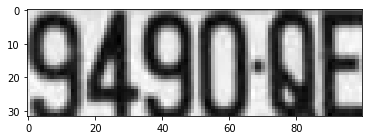

In [ ]:
plt.imshow(res["image"].numpy()[:,:,0].T,cmap='gray')

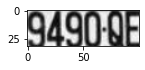

In [ ]:
res= preprocess_data_for_orig_arch("/content/drive/MyDrive/ALPR_Data/Images_All/RP_2.jpg",[1,2,3,4,5,6])
#res["image"].numpy().shape
plt.figure(figsize=(2, 2))
plt.imshow(res["image"].numpy()[:,:,0].T,cmap='gray')

### Custom CTC Loss Layer Class Creation

In [ ]:
class CTCLayer(layers.Layer):

    def __init__(self, name=None, **kwargs):

        super().__init__(name=name, **kwargs)
        self.loss_fn = keras.backend.ctc_batch_cost

    def call(self, y_true, y_pred):
        # Compute the training-time loss value and add it
        # to the layer using `self.add_loss()`.

        batch_len = tf.cast(tf.shape(y_true)[0], dtype="int64")
        input_length = tf.cast(tf.shape(y_pred)[1], dtype="int64")
        label_length = tf.cast(tf.shape(y_true)[1], dtype="int64")

        input_length = input_length * tf.ones(shape=(batch_len, 1), dtype="int64")
        label_length = label_length * tf.ones(shape=(batch_len, 1), dtype="int64")

        loss = self.loss_fn(y_true, y_pred, input_length, label_length)
        self.add_loss(loss)

        # At test time, just return the computed predictions
        return y_pred

### CTC Decoder to Text Function

In [ ]:
def ctc_decoder(predictions):
    '''
    input: given batch of predictions from text rec model
    output: return lists of raw extracted text

    '''
    text_list = []
    
    pred_indcies = np.argmax(predictions, axis=2)
    
    for i in range(pred_indcies.shape[0]):
        ans = ""
        
        ## merging repeats
        merged_list = [k for k,_ in groupby(pred_indcies[i])]
        
        ## removing blanks
        for p in merged_list:
            if p != len(char_list):
                ans += char_list[int(p)]
        
        text_list.append(ans)
        
    return text_list

### Evaluation Function for Accuarcy And Character Acccuracy

In [ ]:
def evaluate_accuracies(actual_labels,predicted_labels):
    """
    Takes a List of Actual Outputs, predicted Outputs and returns their accuracy and letter accuracy across
    all the labels in the list
    """
    accuracy=0
    letter_acc=0
    letter_cnt=0
    count=0
    for i in range(len(actual_labels)):
        predicted_output=predicted_labels[i]
        actual_output=actual_labels[i]
        count+=1
        for j in range(min(len(predicted_output),len(actual_output))):
            if predicted_output[j]==actual_output[j]:
                letter_acc+=1
        letter_cnt+=max(len(predicted_output),len(actual_output))
        if actual_output==predicted_output:
            accuracy+=1
    final_accuracy=round((accuracy/len(actual_labels))*100,2)
    final_letter_acc=round((letter_acc/letter_cnt)*100,2)
    return final_accuracy,final_letter_acc

In [ ]:
evaluate_accuracies(['abcd23', 'sdfg24','jhkl56', 'diut82', 'mkft34'],['abcd23', 'sdfg23','jhkl56', 'diut81', 'mkft34'])

(60.0, 93.33)

### Custom Call Back Class

In [ ]:
#figures_list = []

class PlotPredictions(tf.keras.callbacks.Callback):

    def __init__(self, val_dataset, frequency=1, Accuracy_file=None, arch_type='Original'):
        self.frequency = frequency
        self.Accuracy_file = Accuracy_file
        self.val_dataset = val_dataset
        self.arch_type = arch_type
        super(PlotPredictions, self).__init__()

        batch = val_dataset.take(1)
        self.batch_images = list(batch.as_numpy_iterator())[0]["image"]
        self.batch_labels = list(batch.as_numpy_iterator())[0]["label"]

    def plot_predictions(self, epoch):

        prediction_model = keras.models.Model(
            self.model.get_layer(name="image").input, 
            self.model.get_layer(name="dense").output
        )
        
        preds = prediction_model.predict(self.batch_images)
        pred_texts = ctc_decoder(preds)

        orig_texts = []

        for label in self.batch_labels:
            orig_texts.append("".join([char_list[int(char_ind)] for char_ind in label if not(char_ind == len(char_list))]))
          
        plate_acc, letter_acc = evaluate_accuracies(orig_texts,pred_texts)

        with open(self.Accuracy_file, 'a') as accfile:
          accfile.write(str(plate_acc)+","+str(letter_acc)+"\n")

        fig , ax = plt.subplots(4, 4, figsize=(15, 5))
        fig.suptitle('Epoch: '+str(epoch), weight='bold', size=14)

        for i in range(16):
            if self.arch_type =='Original':
              img = (self.batch_images[i, :, :, 0] * 255).T.astype(np.uint8)
            else:
              img = (self.batch_images[i, :, :, 0] * 255).astype(np.uint8)
            title = f"Prediction: {pred_texts[i]}"
            ax[i // 4, i % 4].imshow(img, cmap="gray")
            ax[i // 4, i % 4].set_title(title)
            ax[i // 4, i % 4].axis("off")
        
        plt.show()
        #plt.savefig("predictions_epoch_"+ str(epoch)+'.png', bbox_inches = 'tight', pad_inches = 0)
        
        #figures_list.append(fig)

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.frequency == 0:
            self.plot_predictions(epoch)

### Applying Pre-processing function on the Tensorflow Dataset

In [ ]:
train_dataset_orig_arch =  train_dataset.map(
        preprocess_data_for_orig_arch, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(batch_size).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

val_dataset_orig_arch =  val_dataset.map(
        preprocess_data_for_orig_arch, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(batch_size).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
train_dataset_modified =  train_dataset.map(
        preprocess_data, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(batch_size).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

val_dataset_modified =  val_dataset.map(
        preprocess_data, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(batch_size).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

## Mislabelling Check

In [ ]:
train_dataset_chk =  train_dataset.batch(batch_size).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
val_dataset_chk =  val_dataset.batch(batch_size).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
def get_bb_box_py(image_file):
  bb_filepath = os.path.join(bb_dir_path,os.path.basename(image_file).replace(".jpg",".txt"))
  #print(bb_filepath)
  with open (bb_filepath) as f:
    bb_box = list(map(int,[float(x.strip()) for x in f.readlines()]))
    #print(bb_box)
    offset_height, offset_width, target_height, target_width = bb_box[1], bb_box[0], bb_box[3]-bb_box[1] , bb_box[2]-bb_box[0]
    return offset_height, offset_width, target_height, target_width

In [ ]:
list(zip(train_image_files,padded_train_labels))[:32]

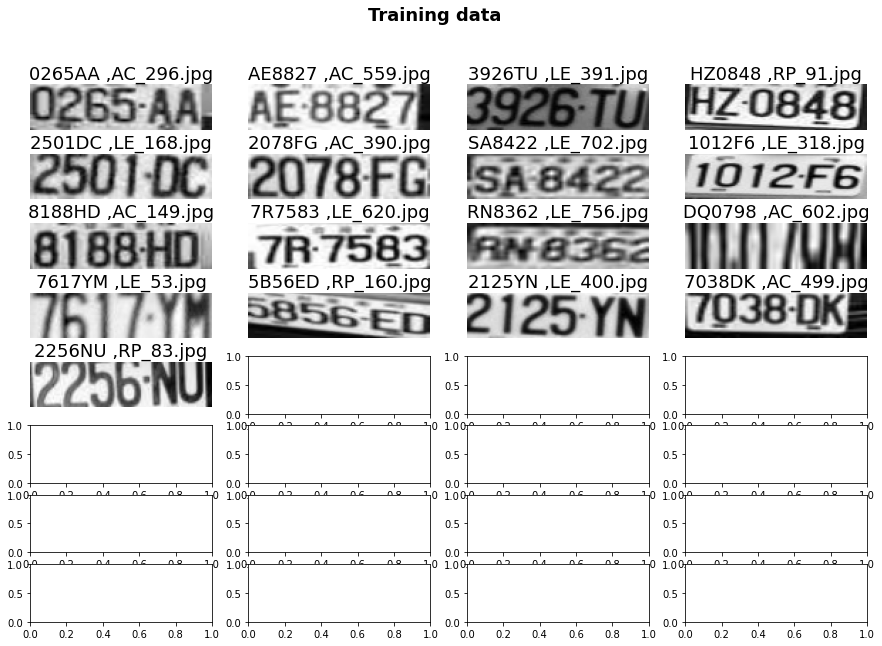

In [ ]:
train_data_fig, ax = plt.subplots(8, 4, figsize=(15, 10))
train_data_fig.suptitle('Training data', weight='bold', size=18)

#chk_dataset = train_dataset_chk.as_numpy_iterator()
for idx, inputs in enumerate(list(zip(train_image_files,padded_train_labels))[1408:1440]):
  image_f = inputs[0] 
  lable  = inputs[1] 
  
  img_file=os.path.basename(image_f)
  img = tf.io.read_file(image_f)
  img = tf.io.decode_image(img)
  offset_height, offset_width, target_height, target_width = get_bb_box_py( image_f) 
      #print(get_bb_box( images[i]) )
  plate_img = tf.image.crop_to_bounding_box(img, offset_height, offset_width, target_height, target_width)
  plate_img = tf.cast(plate_img, tf.float32) 
      #print(plate_img.shape)
  plate_img = tf.image.rgb_to_grayscale(plate_img)
  plate_img = tf.image.resize(plate_img, [img_height, img_width])
  label = decode_label_to_text(lable)
  label = label.replace('[UNK]', '')
  #print(img_file, label)
  ax[idx // 4, idx % 4].imshow(plate_img[:,:,0], cmap="gray")
  ax[idx // 4, idx % 4].set_title(label+' ,'+img_file , fontsize=18)
  ax[idx // 4, idx % 4].axis("off")
  
plt.show()

## Mislabelling Correction

In [ ]:
final_img_dir = "/content/drive/MyDrive/ALPR_Data/Images_All/"
mislable_det_dir = "/content/drive/MyDrive/ALPR_Data/Mislabelled/Localization/"
final_milablled_detect = ['RP_103','AC_312','AC_308','RP_113','RP_107','RP_89','RP_567','RP_102']

for fm in final_milablled_detect:
  os.rename(final_img_dir+fm+'.jpg', mislable_det_dir+fm+'.jpg')


In [ ]:
mislable_rec_dir =['RP_61','RP_45','RP_144','RP_275']
for fm in mislable_rec_dir:
  with open (data_dir_recog+fm+'.txt') as msfm:
    print(fm,''.join(msfm.readlines()))

RP_61 C
V
6
9
0
8

RP_45 1
1
1
1
1
Z

RP_144 B
6
7
C
F
X

RP_275 9
Z
1
1
K
G



In [ ]:
mislable_rec_dir =['RP_61','RP_45','RP_144','RP_275']
for fm in mislable_rec_dir:
  with open (data_dir_recog+fm+'.txt') as msfm:
    print(fm,msfm.readlines())

RP_61 ['3\n', '0\n', '7\n', '9\n', 'D\n', 'F\n']
RP_45 ['3\n', '0\n', '7\n', '9\n', 'D\n', 'F\n']
RP_144 ['8\n', '6\n', '7\n', '6\n', 'F\n', 'X\n']
RP_275 ['9\n', '7\n', '1\n', '1\n', 'K\n', 'G\n']


In [ ]:
correct_labels =[['3\n', '0\n', '7\n', '9\n', 'D\n', 'F\n'], ['3\n', '0\n', '7\n', '9\n', 'D\n', 'F\n'] ,
 ['8\n', '6\n', '7\n', '6\n', 'F\n', 'X\n'],  ['9\n', '7\n', '1\n', '1\n', 'K\n', 'G\n']]

for fm, lbl in zip(mislable_rec_dir, correct_labels):
  with open (data_dir_recog+fm+'.txt','w') as msfm:
  #print(data_dir_recog+fm+'.txt')
  #print(''.join(lbl))
    msfm.write(''.join(lbl))


In [ ]:
os.path.exists("/content/drive/MyDrive/ALPR_Data/Images_All/RP_103.jpg")

False

In [ ]:
def decode_label_to_text(lbl_lst):
  return ''.join (['' if x==35 else char_list[x] for x in lbl_lst])
decode_label_to_text([30,  8  ,1 , 0 , 4 , 1])

'V81041'

### Training Data Sanity Check

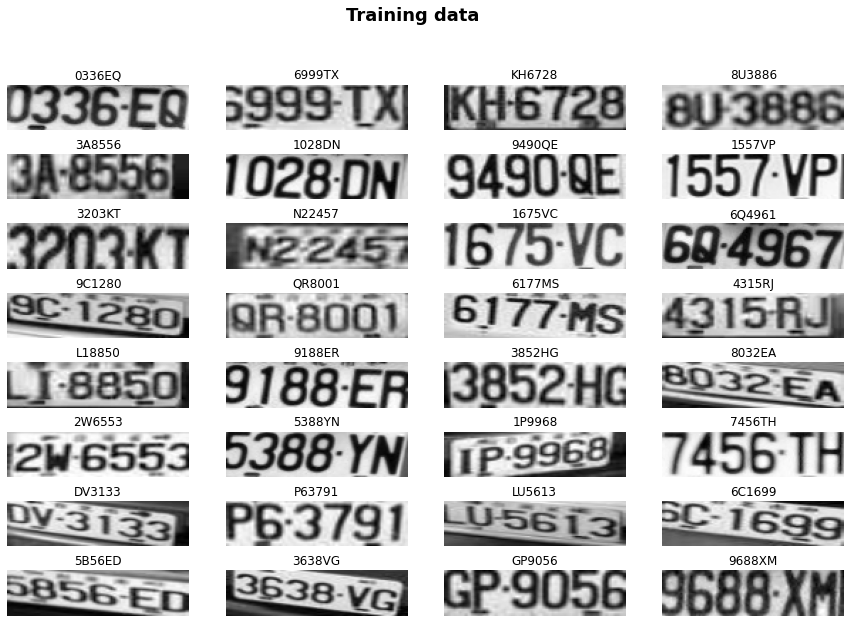

In [ ]:

train_data_fig, ax = plt.subplots(8, 4, figsize=(15, 10))
train_data_fig.suptitle('Training data', weight='bold', size=18)


for batch in train_dataset.take(1):
    images = batch["image"]
    labels = batch["label"]

    for i in range(32):
        img = (images[i]*255 ).numpy().astype("uint8")
        #label = tf.strings.reduce_join(num_to_char(labels[i])).numpy().decode("utf-8")
        lbl_lst = labels[i].numpy()
        label = decode_label_to_text(lbl_lst)
        #print(label_act)

        label = label.replace('[UNK]', '')
        ax[i // 4, i % 4].imshow(img[:, :, 0], cmap="gray")
        ax[i // 4, i % 4].set_title(label)
        ax[i // 4, i % 4].axis("off")
    
plt.show()


### checking training data

In [ ]:
#char_to_num = layers.experimental.preprocessing.StringLookup(
  #  vocabulary=char_list, num_oov_indices=1, mask_token=None
#)

# Mapping integers back to original characters
#num_to_char = layers.experimental.preprocessing.StringLookup(
   # vocabulary=char_to_num.get_vocabulary(), mask_token=None, invert=True
#)

train_data_fig, ax = plt.subplots(8, 4, figsize=(15, 10))
train_data_fig.suptitle('Training data', weight='bold', size=18)


for batch in val_dataset_orig_arch.take(1):
    images = batch["image"]
    labels = batch["label"]

    for i in range(32):
        img = (images[i]*255 ).numpy().astype("uint8")
        #label = tf.strings.reduce_join(num_to_char(labels[i])).numpy().decode("utf-8")
        lbl_lst = labels[i].numpy()
        label = decode_label_to_text(lbl_lst)
        #print(label_act)

        label = label.replace('[UNK]', '')
        ax[i // 4, i % 4].imshow(img[:, :, 0].T, cmap="gray")
        ax[i // 4, i % 4].set_title(label)
        ax[i // 4, i % 4].axis("off")
    #plt.imshow(res["image"].numpy()[:,:,0].T,cmap='gray')
plt.show()


### Architecture 2 with LSTSM

In [ ]:
def build_model1():
    
    # input with shape of height=32 and width=128 
    inputs = Input(shape=(img_height, img_width, 1), name="image")

    labels = layers.Input(name="label", shape=(None,), dtype="float32")

    conv_1 = Conv2D(32, (3,3), activation = "selu", padding='same')(inputs)
    pool_1 = MaxPool2D(pool_size=(2, 2))(conv_1)
    
    conv_2 = Conv2D(64, (3,3), activation = "selu", padding='same')(pool_1)
    pool_2 = MaxPool2D(pool_size=(2, 2))(conv_2)

    conv_3 = Conv2D(128, (3,3), activation = "selu", padding='same')(pool_2)
    conv_4 = Conv2D(128, (3,3), activation = "selu", padding='same')(conv_3)

    pool_4 = MaxPool2D(pool_size=(2, 1))(conv_4)
    
    conv_5 = Conv2D(256, (3,3), activation = "selu", padding='same')(pool_4)
    
    # Batch normalization layer
    batch_norm_5 = BatchNormalization()(conv_5)
    
    conv_6 = Conv2D(256, (3,3), activation = "selu", padding='same')(batch_norm_5)
    batch_norm_6 = BatchNormalization()(conv_6)
    pool_6 = MaxPool2D(pool_size=(2, 1))(batch_norm_6)
    
    conv_7 = Conv2D(64, (2,2), activation = "selu")(pool_6)
    
    squeezed = Lambda(lambda x: K.squeeze(x, 1))(conv_7)
    
    # bidirectional LSTM layers with units=128
    blstm_1 = Bidirectional(CuDNNLSTM(128, return_sequences=True))(squeezed)
    blstm_2 = Bidirectional(CuDNNLSTM(128, return_sequences=True))(blstm_1)

    softmax_output = Dense(len(char_list) + 1, activation = 'softmax', name="dense")(blstm_2)

    output = CTCLayer(name="ctc_loss")(labels, softmax_output)


    optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, clipnorm=1.0)

    #model to be used at training time
    model = Model(inputs=[inputs, labels], outputs=output)
    model.compile(optimizer = optimizer)

    print(model.summary())
       
    return model

### General Training Function

In [ ]:
def train_model(model, epochs,train_data,validation_data, Accuracy_file,model_path, arch_type):
  
  checkpoint = ModelCheckpoint(filepath=model_path, 
                                monitor='val_loss', 
                                verbose=1, 
                                save_best_only=True, 
                                mode='min')
  callbacks_list = [checkpoint, 
                      PlotPredictions(val_dataset =validation_data, frequency=1,Accuracy_file=Accuracy_file,arch_type=arch_type),
                      #EarlyStopping(patience=10, verbose=1)
                      ]
  history = model.fit(x = train_data, 
                        epochs = epochs,
                        validation_data=validation_data,
                        verbose = 1,
                        callbacks = callbacks_list,
                        shuffle=True)
  return history

In [ ]:
import datetime
outputdir = '/content/drive/MyDrive/ALP_Model/Recog_Output/'
curr_dt_time = datetime.datetime.now()
model_name = datetime.datetime.now().strftime(format = '%Y-%m-%d:%I:%M')+'_CRNN_Modified_LSTM'
#model_name
filepath = outputdir+ model_name +'.h5'
Acc_file = outputdir+model_name+'_epoch_acc.csv'
print(filepath)
print(Acc_file)

/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5
/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM_epoch_acc.csv


In [ ]:
# Compiling the model
model1 = build_model1()

Model: "model_52"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 32, 128, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d_14 (Conv2D)             (None, 32, 128, 32)  320         ['image[0][0]']                  
                                                                                                  
 max_pooling2d_8 (MaxPooling2D)  (None, 16, 64, 32)  0           ['conv2d_14[0][0]']              
                                                                                                  
 conv2d_15 (Conv2D)             (None, 16, 64, 64)   18496       ['max_pooling2d_8[0][0]'] 

In [ ]:
# capturing the architecture
table1=pd.DataFrame(columns=["Name","Type","Shape"])
for layer in model1.layers:
    table1 = table1.append({"Name":layer.name, "Type": layer.__class__.__name__,"Shape":layer.output_shape}, ignore_index=True)
table1.to_csv('/content/drive/MyDrive/ALP_Model/Recog_Output/LSTM_Arch.csv')

### Training Model 1

Epoch 1/50
45/45 [==============================] - ETA: 0s - loss: 22.7086
Epoch 1: val_loss improved from inf to 20.22268, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


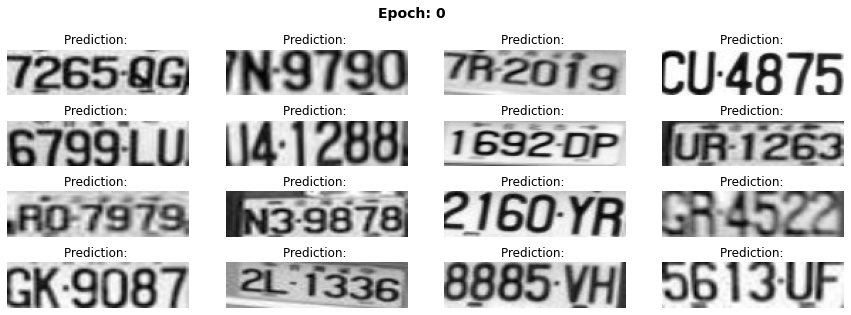

45/45 [==============================] - 13s 210ms/step - loss: 22.7086 - val_loss: 20.2227
Epoch 2/50
44/45 [============================>.] - ETA: 0s - loss: 19.4533
Epoch 2: val_loss improved from 20.22268 to 19.62404, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


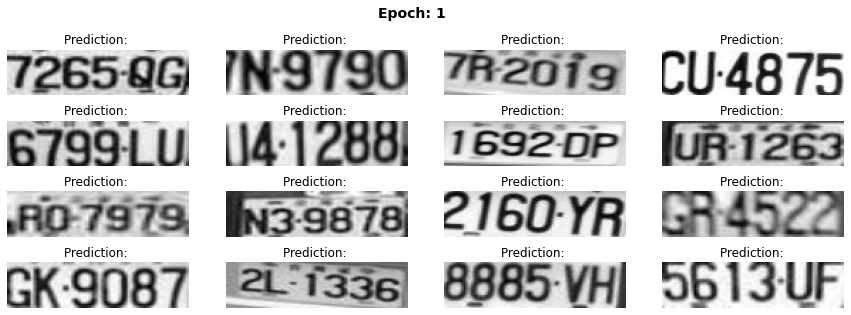

45/45 [==============================] - 9s 193ms/step - loss: 19.4563 - val_loss: 19.6240
Epoch 3/50
44/45 [============================>.] - ETA: 0s - loss: 18.5797
Epoch 3: val_loss improved from 19.62404 to 19.48688, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


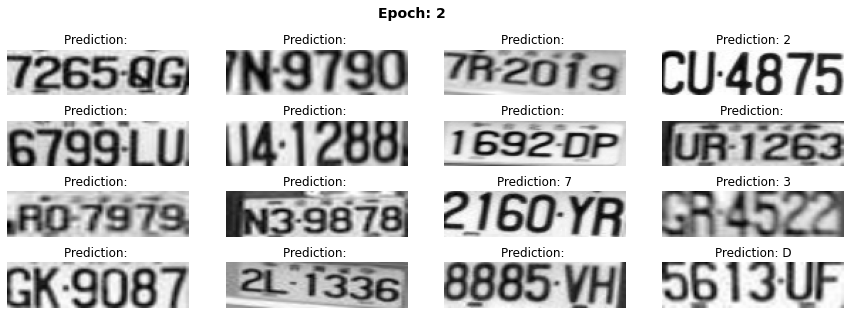

45/45 [==============================] - 8s 176ms/step - loss: 18.5877 - val_loss: 19.4869
Epoch 4/50
44/45 [============================>.] - ETA: 0s - loss: 16.3725
Epoch 4: val_loss improved from 19.48688 to 16.10612, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


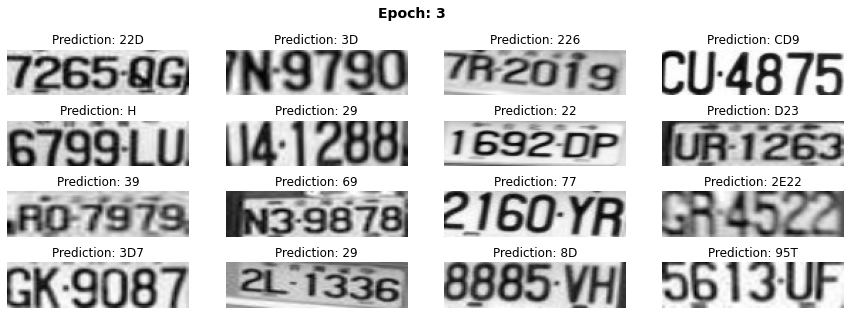

45/45 [==============================] - 8s 178ms/step - loss: 16.3726 - val_loss: 16.1061
Epoch 5/50
44/45 [============================>.] - ETA: 0s - loss: 12.2538
Epoch 5: val_loss improved from 16.10612 to 12.92902, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


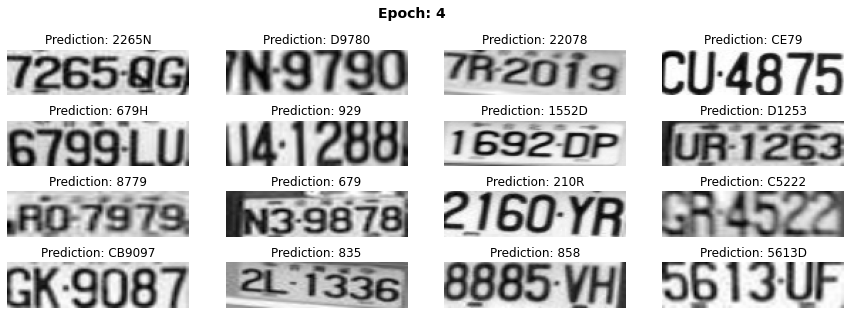

45/45 [==============================] - 8s 172ms/step - loss: 12.2515 - val_loss: 12.9290
Epoch 6/50
44/45 [============================>.] - ETA: 0s - loss: 8.5753
Epoch 6: val_loss did not improve from 12.92902


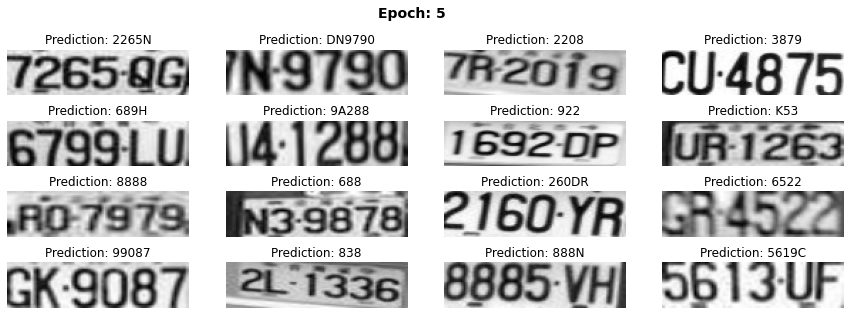

45/45 [==============================] - 8s 169ms/step - loss: 8.5744 - val_loss: 14.9126
Epoch 7/50
44/45 [============================>.] - ETA: 0s - loss: 5.9345
Epoch 7: val_loss improved from 12.92902 to 7.17975, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


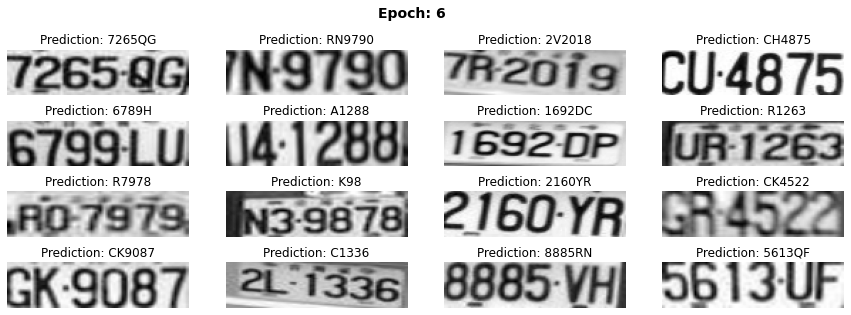

45/45 [==============================] - 8s 177ms/step - loss: 5.9369 - val_loss: 7.1797
Epoch 8/50
44/45 [============================>.] - ETA: 0s - loss: 4.3419
Epoch 8: val_loss improved from 7.17975 to 5.54517, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


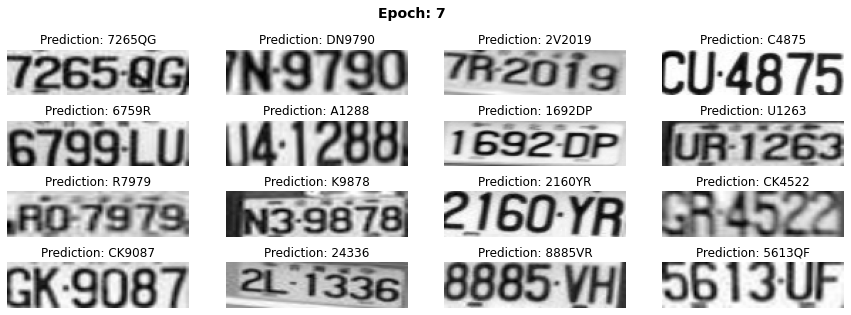

45/45 [==============================] - 8s 181ms/step - loss: 4.3458 - val_loss: 5.5452
Epoch 9/50
44/45 [============================>.] - ETA: 0s - loss: 3.3302
Epoch 9: val_loss did not improve from 5.54517


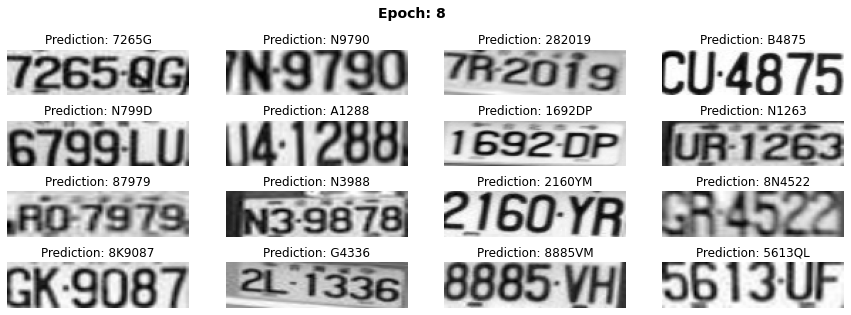

45/45 [==============================] - 8s 172ms/step - loss: 3.3314 - val_loss: 6.4476
Epoch 10/50
45/45 [==============================] - ETA: 0s - loss: 2.5103
Epoch 10: val_loss improved from 5.54517 to 3.64564, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


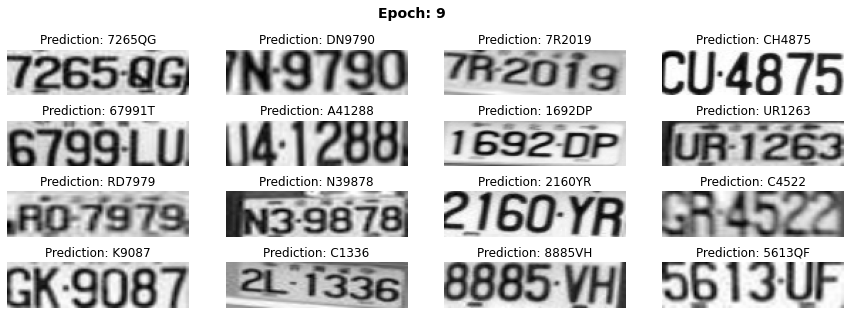

45/45 [==============================] - 8s 184ms/step - loss: 2.5103 - val_loss: 3.6456
Epoch 11/50
44/45 [============================>.] - ETA: 0s - loss: 1.9710
Epoch 11: val_loss did not improve from 3.64564


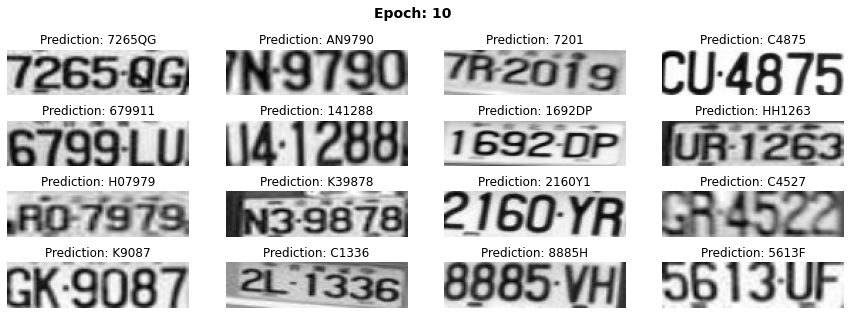

45/45 [==============================] - 8s 170ms/step - loss: 1.9724 - val_loss: 6.9336
Epoch 12/50
44/45 [============================>.] - ETA: 0s - loss: 1.4397
Epoch 12: val_loss improved from 3.64564 to 3.07321, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


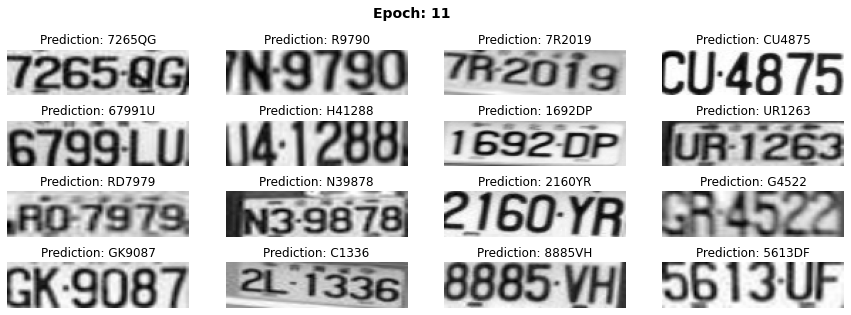

45/45 [==============================] - 9s 194ms/step - loss: 1.4357 - val_loss: 3.0732
Epoch 13/50
44/45 [============================>.] - ETA: 0s - loss: 1.2347
Epoch 13: val_loss did not improve from 3.07321


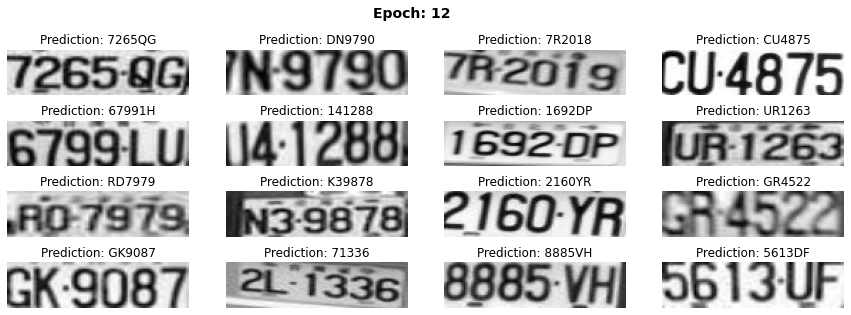

45/45 [==============================] - 8s 181ms/step - loss: 1.2306 - val_loss: 3.1257
Epoch 14/50
45/45 [==============================] - ETA: 0s - loss: 1.0738
Epoch 14: val_loss improved from 3.07321 to 2.76334, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


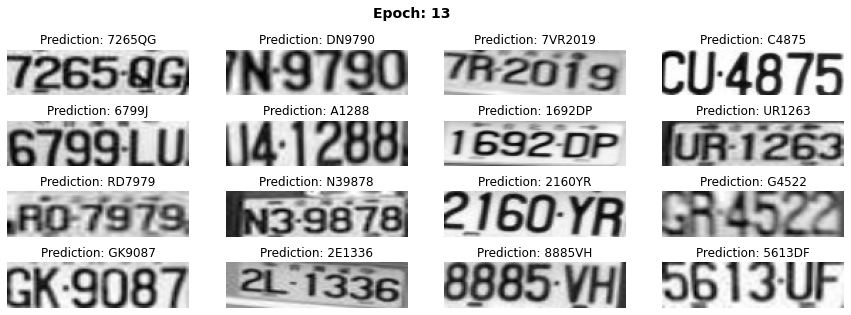

45/45 [==============================] - 8s 188ms/step - loss: 1.0738 - val_loss: 2.7633
Epoch 15/50
44/45 [============================>.] - ETA: 0s - loss: 0.7419
Epoch 15: val_loss improved from 2.76334 to 2.69738, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


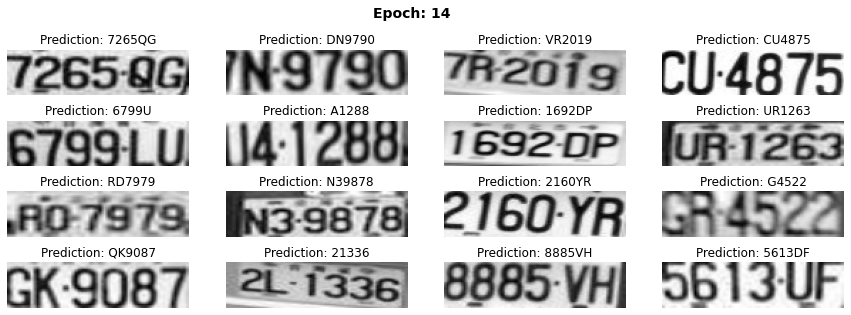

45/45 [==============================] - 8s 184ms/step - loss: 0.7379 - val_loss: 2.6974
Epoch 16/50
44/45 [============================>.] - ETA: 0s - loss: 0.5870
Epoch 16: val_loss improved from 2.69738 to 2.37847, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


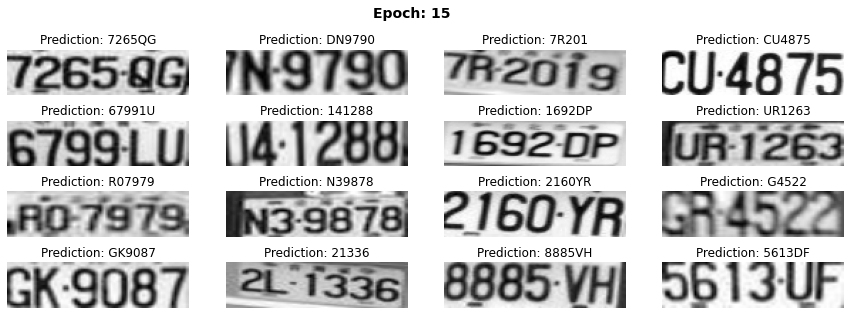

45/45 [==============================] - 9s 204ms/step - loss: 0.5844 - val_loss: 2.3785
Epoch 17/50
44/45 [============================>.] - ETA: 0s - loss: 0.5186
Epoch 17: val_loss did not improve from 2.37847


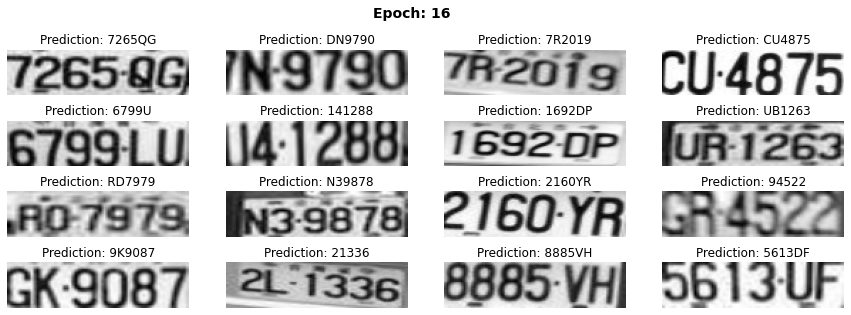

45/45 [==============================] - 11s 243ms/step - loss: 0.5229 - val_loss: 2.4540
Epoch 18/50
44/45 [============================>.] - ETA: 0s - loss: 0.4452
Epoch 18: val_loss did not improve from 2.37847


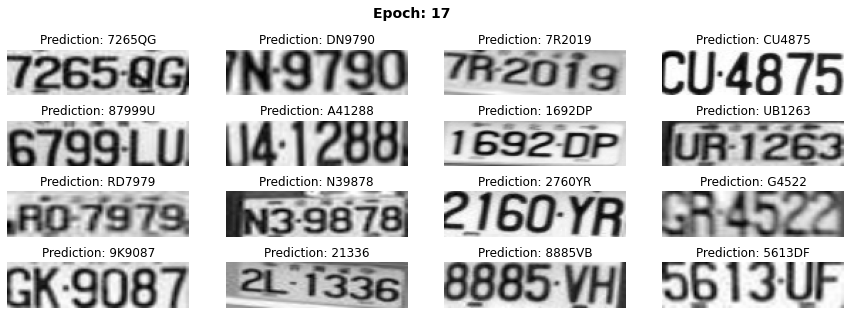

45/45 [==============================] - 8s 179ms/step - loss: 0.4469 - val_loss: 3.0662
Epoch 19/50
45/45 [==============================] - ETA: 0s - loss: 0.3640
Epoch 19: val_loss did not improve from 2.37847


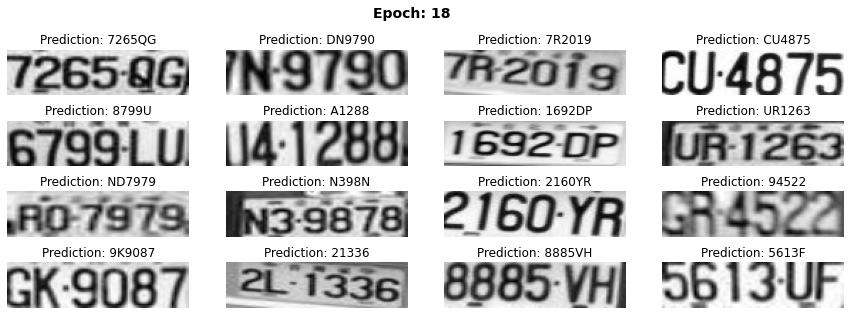

45/45 [==============================] - 8s 176ms/step - loss: 0.3640 - val_loss: 4.1886
Epoch 20/50
45/45 [==============================] - ETA: 0s - loss: 0.3276
Epoch 20: val_loss did not improve from 2.37847


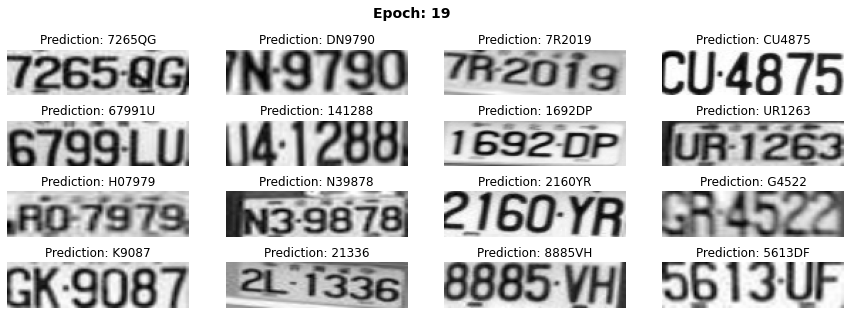

45/45 [==============================] - 8s 186ms/step - loss: 0.3276 - val_loss: 2.6390
Epoch 21/50
45/45 [==============================] - ETA: 0s - loss: 0.2594
Epoch 21: val_loss improved from 2.37847 to 1.95183, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


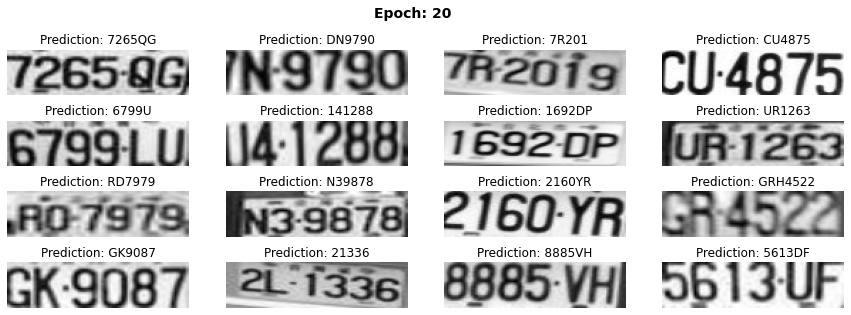

45/45 [==============================] - 9s 194ms/step - loss: 0.2594 - val_loss: 1.9518
Epoch 22/50
45/45 [==============================] - ETA: 0s - loss: 0.2672
Epoch 22: val_loss did not improve from 1.95183


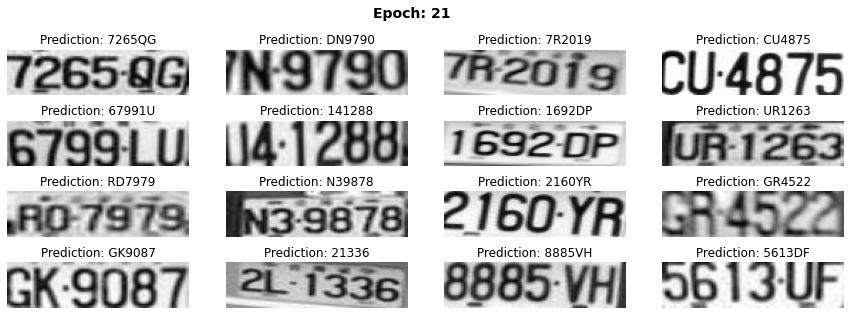

45/45 [==============================] - 8s 184ms/step - loss: 0.2672 - val_loss: 2.1047
Epoch 23/50
44/45 [============================>.] - ETA: 0s - loss: 0.2269
Epoch 23: val_loss improved from 1.95183 to 1.94956, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


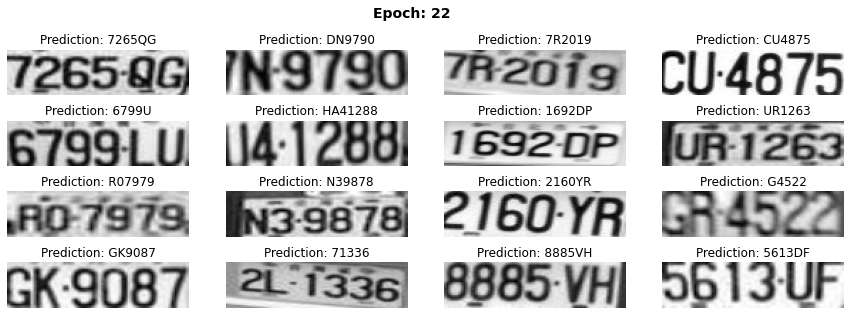

45/45 [==============================] - 9s 191ms/step - loss: 0.2271 - val_loss: 1.9496
Epoch 24/50
44/45 [============================>.] - ETA: 0s - loss: 0.1824
Epoch 24: val_loss did not improve from 1.94956


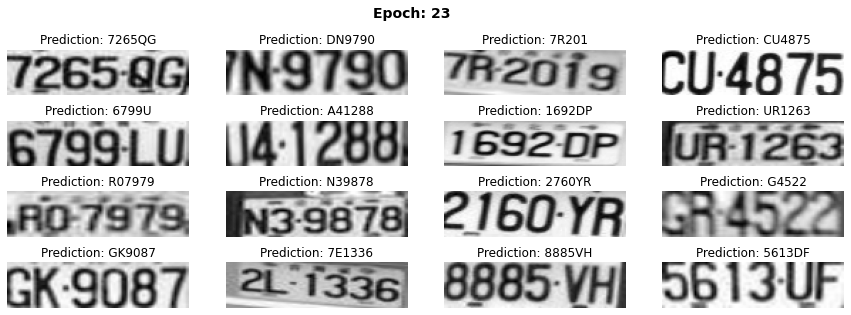

45/45 [==============================] - 9s 196ms/step - loss: 0.1829 - val_loss: 2.5630
Epoch 25/50
45/45 [==============================] - ETA: 0s - loss: 0.1573
Epoch 25: val_loss did not improve from 1.94956


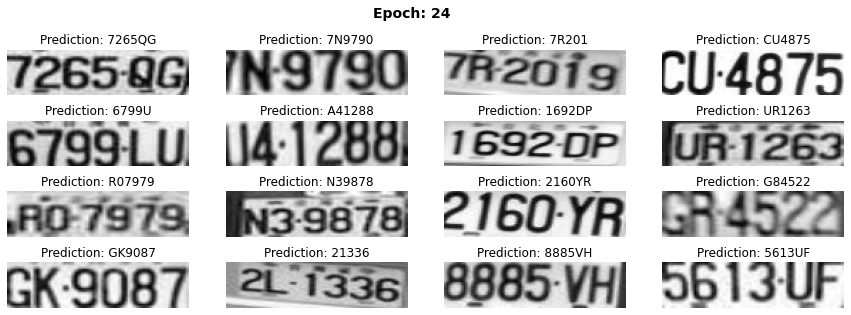

45/45 [==============================] - 8s 184ms/step - loss: 0.1573 - val_loss: 2.0533
Epoch 26/50
44/45 [============================>.] - ETA: 0s - loss: 0.1407
Epoch 26: val_loss did not improve from 1.94956


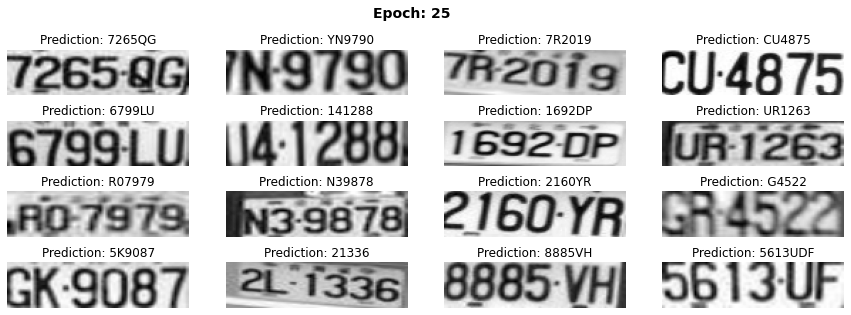

45/45 [==============================] - 8s 184ms/step - loss: 0.1444 - val_loss: 2.3268
Epoch 27/50
44/45 [============================>.] - ETA: 0s - loss: 0.1548
Epoch 27: val_loss did not improve from 1.94956


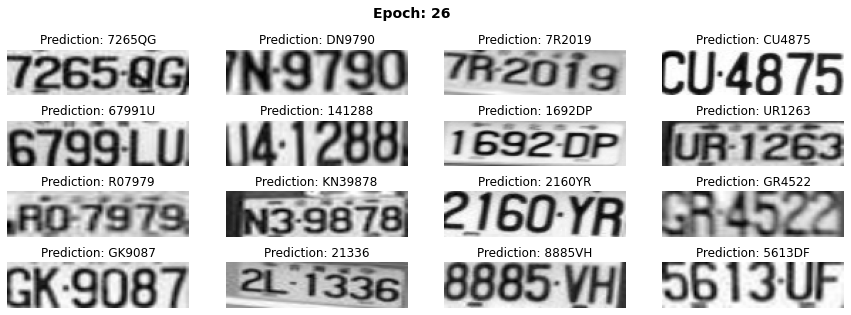

45/45 [==============================] - 8s 184ms/step - loss: 0.1538 - val_loss: 2.1349
Epoch 28/50
44/45 [============================>.] - ETA: 0s - loss: 0.1306
Epoch 28: val_loss improved from 1.94956 to 1.85122, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


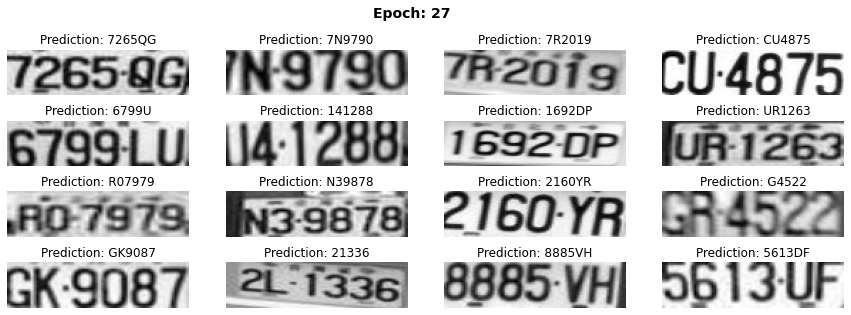

45/45 [==============================] - 9s 203ms/step - loss: 0.1298 - val_loss: 1.8512
Epoch 29/50
44/45 [============================>.] - ETA: 0s - loss: 0.0945
Epoch 29: val_loss did not improve from 1.85122


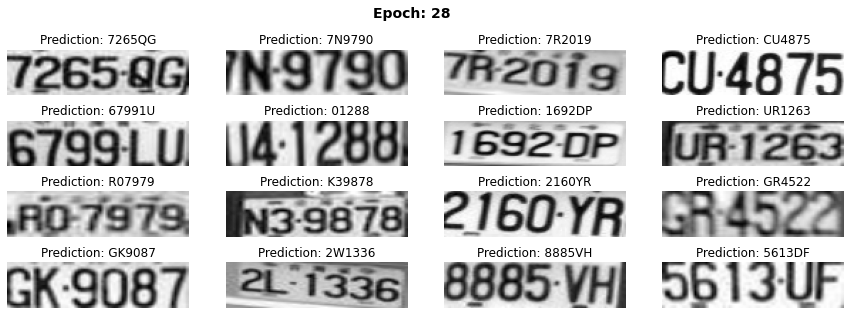

45/45 [==============================] - 9s 208ms/step - loss: 0.0939 - val_loss: 2.0703
Epoch 30/50
44/45 [============================>.] - ETA: 0s - loss: 0.0819
Epoch 30: val_loss did not improve from 1.85122


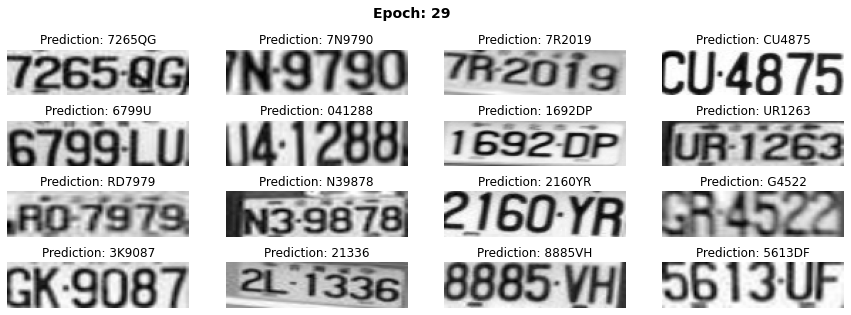

45/45 [==============================] - 8s 186ms/step - loss: 0.0818 - val_loss: 2.4926
Epoch 31/50
44/45 [============================>.] - ETA: 0s - loss: 0.0938
Epoch 31: val_loss did not improve from 1.85122


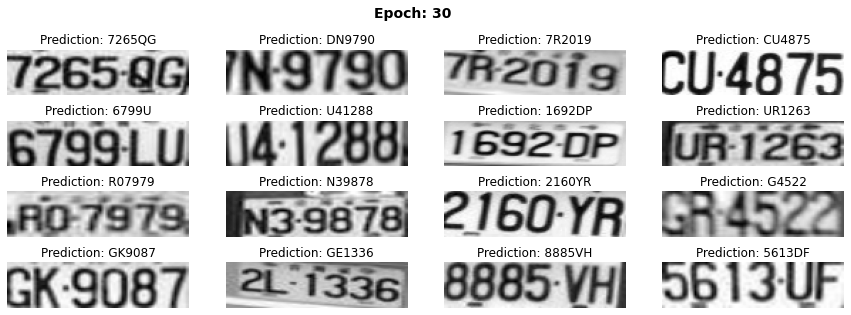

45/45 [==============================] - 8s 188ms/step - loss: 0.0932 - val_loss: 2.2029
Epoch 32/50
45/45 [==============================] - ETA: 0s - loss: 0.1105
Epoch 32: val_loss improved from 1.85122 to 1.73658, saving model to /content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5


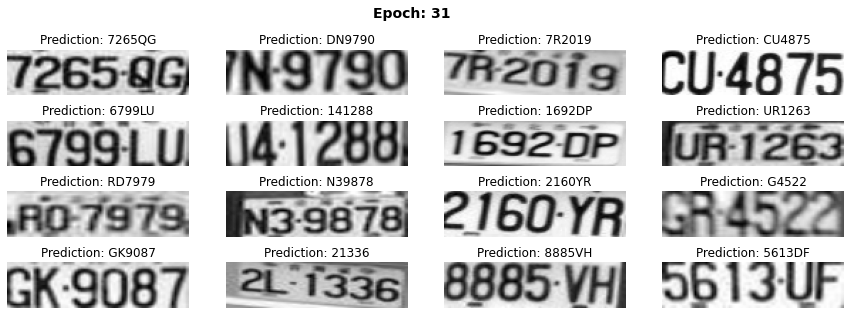

45/45 [==============================] - 9s 208ms/step - loss: 0.1105 - val_loss: 1.7366
Epoch 33/50
45/45 [==============================] - ETA: 0s - loss: 0.0781
Epoch 33: val_loss did not improve from 1.73658


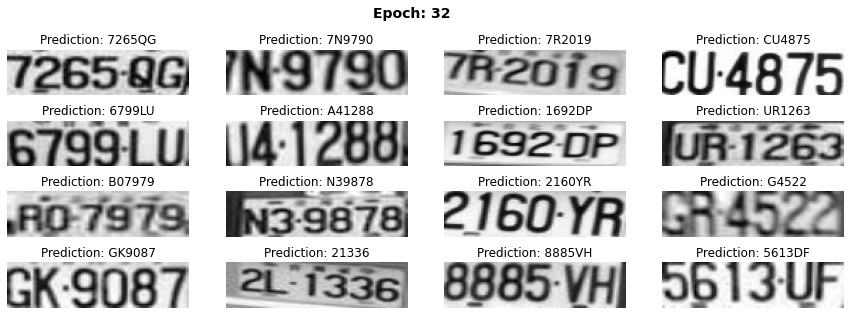

45/45 [==============================] - 9s 195ms/step - loss: 0.0781 - val_loss: 2.1344
Epoch 34/50
44/45 [============================>.] - ETA: 0s - loss: 0.0634
Epoch 34: val_loss did not improve from 1.73658


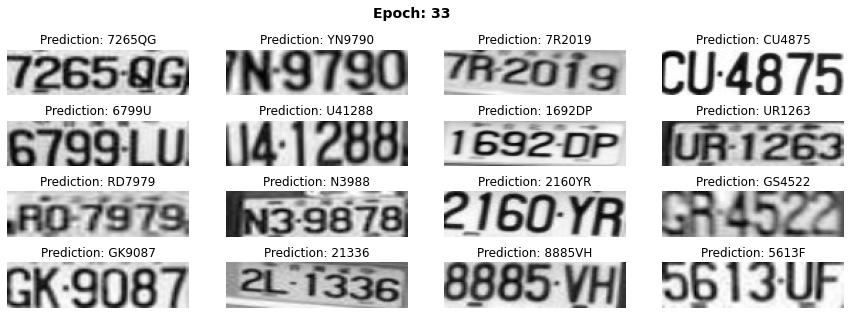

45/45 [==============================] - 9s 192ms/step - loss: 0.0636 - val_loss: 2.1010
Epoch 35/50
44/45 [============================>.] - ETA: 0s - loss: 0.0739
Epoch 35: val_loss did not improve from 1.73658


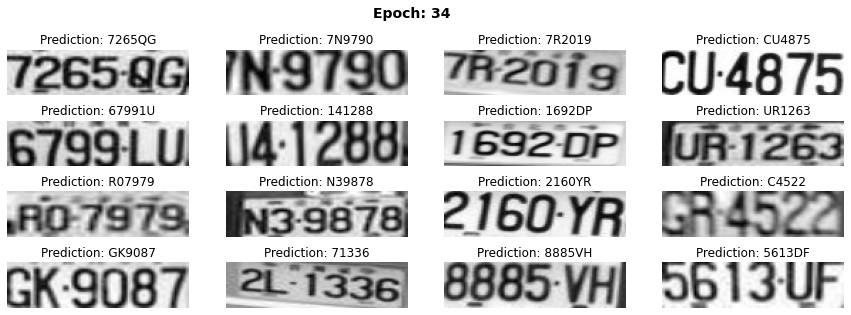

45/45 [==============================] - 9s 191ms/step - loss: 0.0734 - val_loss: 1.8898
Epoch 36/50
45/45 [==============================] - ETA: 0s - loss: 0.0678
Epoch 36: val_loss did not improve from 1.73658


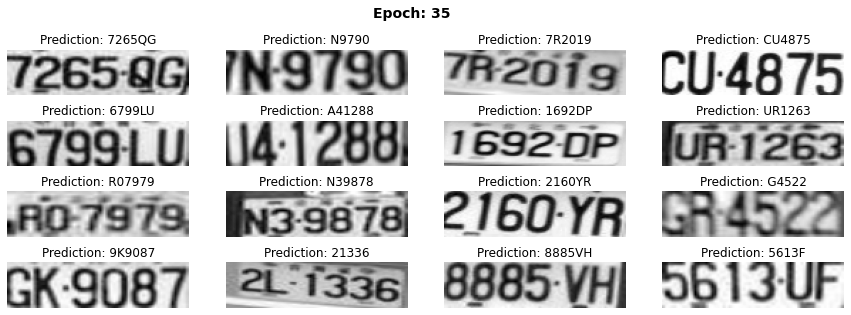

45/45 [==============================] - 12s 273ms/step - loss: 0.0678 - val_loss: 1.8528
Epoch 37/50
45/45 [==============================] - ETA: 0s - loss: 0.0884
Epoch 37: val_loss did not improve from 1.73658


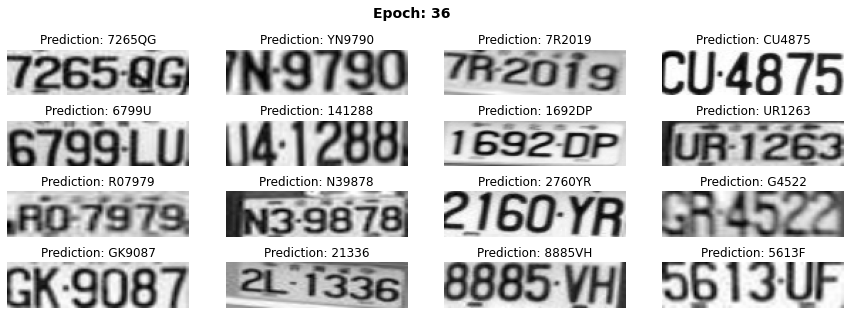

45/45 [==============================] - 9s 201ms/step - loss: 0.0884 - val_loss: 2.5895
Epoch 38/50
44/45 [============================>.] - ETA: 0s - loss: 0.0719
Epoch 38: val_loss did not improve from 1.73658


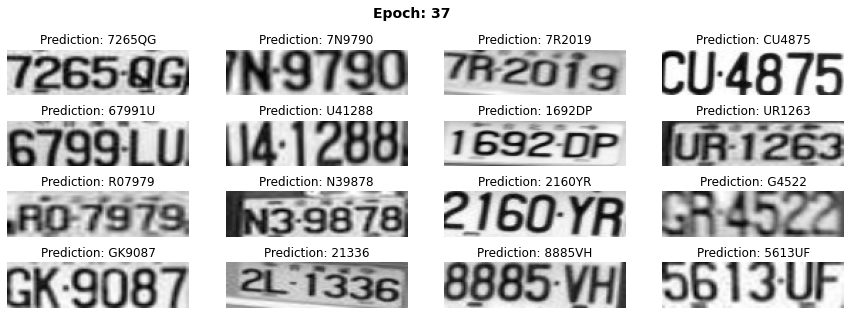

45/45 [==============================] - 9s 204ms/step - loss: 0.0714 - val_loss: 1.9231
Epoch 39/50
45/45 [==============================] - ETA: 0s - loss: 0.0681
Epoch 39: val_loss did not improve from 1.73658


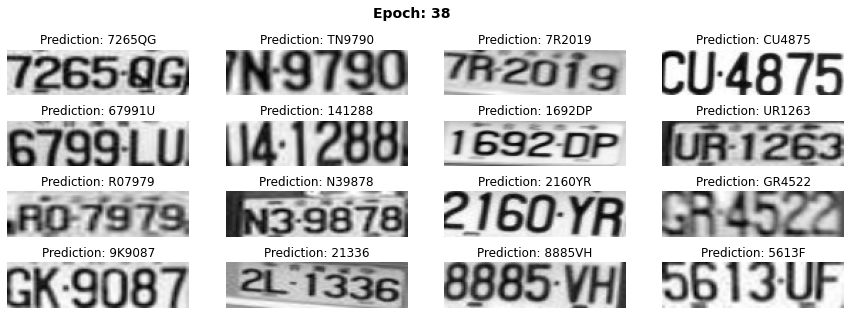

45/45 [==============================] - 9s 196ms/step - loss: 0.0681 - val_loss: 1.8639
Epoch 40/50
45/45 [==============================] - ETA: 0s - loss: 0.0850
Epoch 40: val_loss did not improve from 1.73658


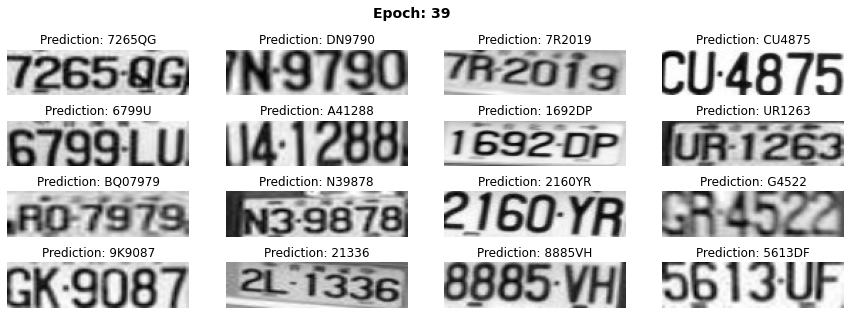

45/45 [==============================] - 11s 251ms/step - loss: 0.0850 - val_loss: 2.4640
Epoch 41/50
44/45 [============================>.] - ETA: 0s - loss: 0.0606
Epoch 41: val_loss did not improve from 1.73658


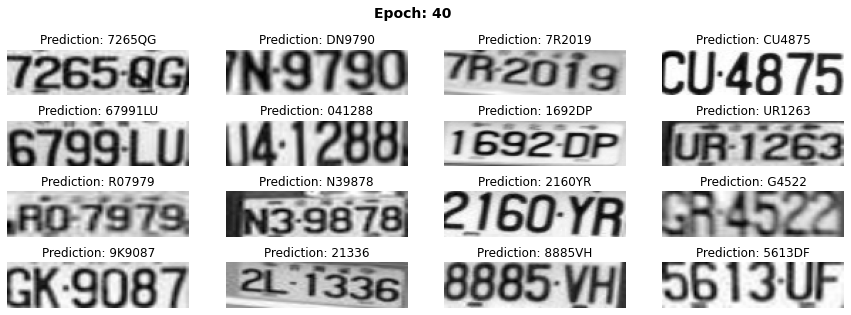

45/45 [==============================] - 9s 200ms/step - loss: 0.0601 - val_loss: 2.2062
Epoch 42/50
44/45 [============================>.] - ETA: 0s - loss: 0.0580
Epoch 42: val_loss did not improve from 1.73658


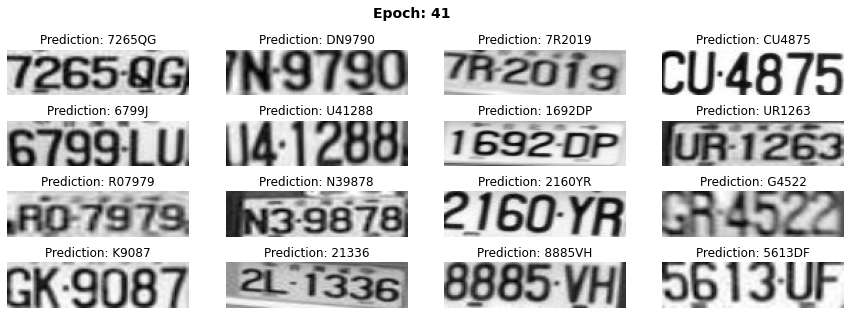

45/45 [==============================] - 9s 198ms/step - loss: 0.0576 - val_loss: 1.8908
Epoch 43/50
44/45 [============================>.] - ETA: 0s - loss: 0.0693
Epoch 43: val_loss did not improve from 1.73658


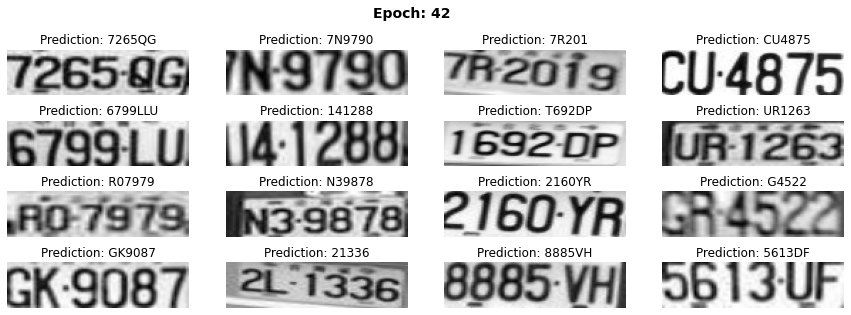

45/45 [==============================] - 9s 198ms/step - loss: 0.0689 - val_loss: 2.1339
Epoch 44/50
44/45 [============================>.] - ETA: 0s - loss: 0.0866
Epoch 44: val_loss did not improve from 1.73658


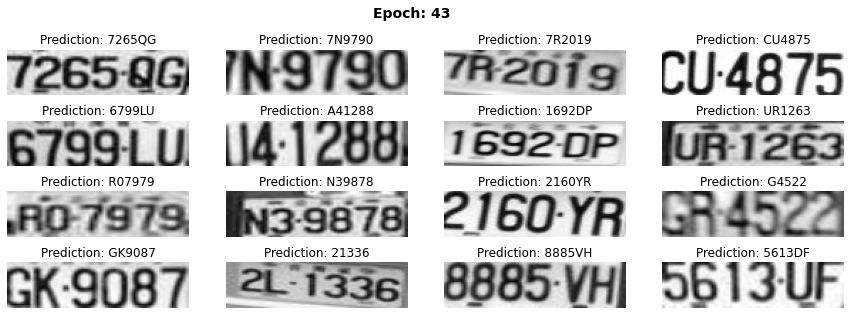

45/45 [==============================] - 9s 206ms/step - loss: 0.0861 - val_loss: 2.1152
Epoch 45/50
44/45 [============================>.] - ETA: 0s - loss: 0.0427
Epoch 45: val_loss did not improve from 1.73658


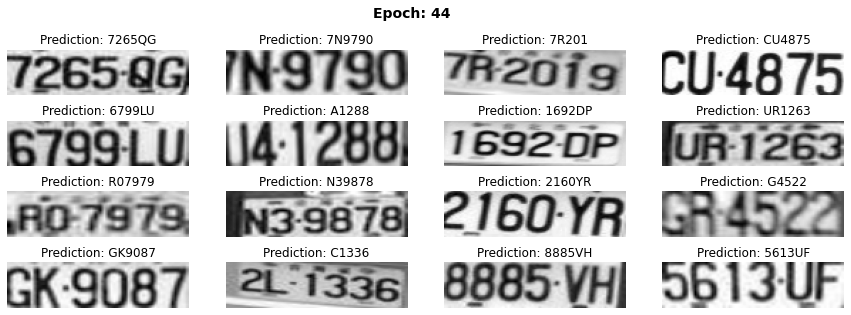

45/45 [==============================] - 9s 206ms/step - loss: 0.0424 - val_loss: 1.8961
Epoch 46/50
44/45 [============================>.] - ETA: 0s - loss: 0.0368
Epoch 46: val_loss did not improve from 1.73658


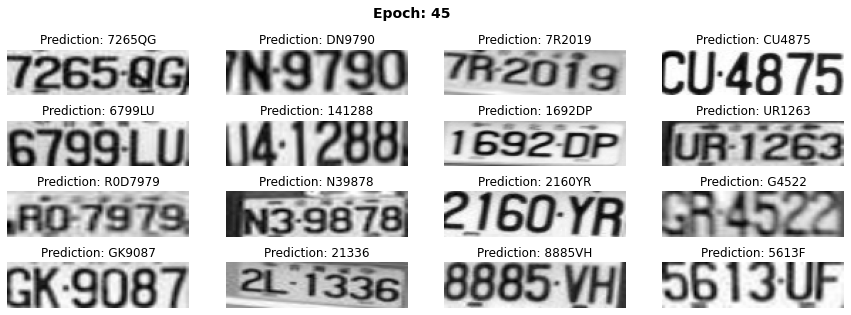

45/45 [==============================] - 9s 201ms/step - loss: 0.0366 - val_loss: 1.8600
Epoch 47/50
45/45 [==============================] - ETA: 0s - loss: 0.0393
Epoch 47: val_loss did not improve from 1.73658


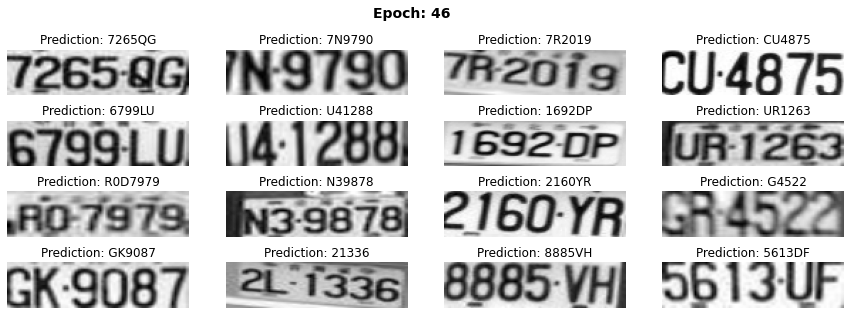

45/45 [==============================] - 12s 275ms/step - loss: 0.0393 - val_loss: 1.8985
Epoch 48/50
45/45 [==============================] - ETA: 0s - loss: 0.0515
Epoch 48: val_loss did not improve from 1.73658


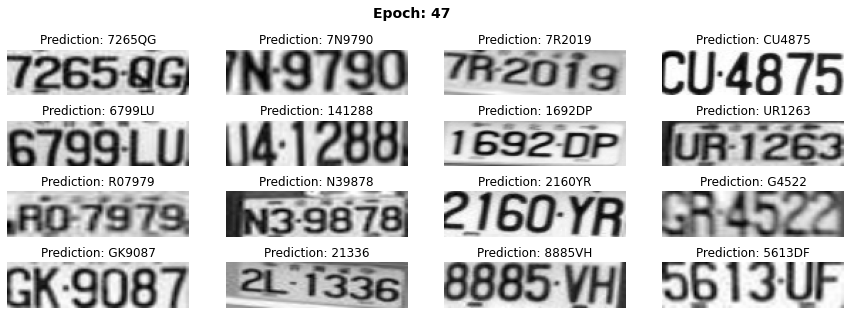

45/45 [==============================] - 14s 304ms/step - loss: 0.0515 - val_loss: 1.9921
Epoch 49/50
45/45 [==============================] - ETA: 0s - loss: 0.0243
Epoch 49: val_loss did not improve from 1.73658


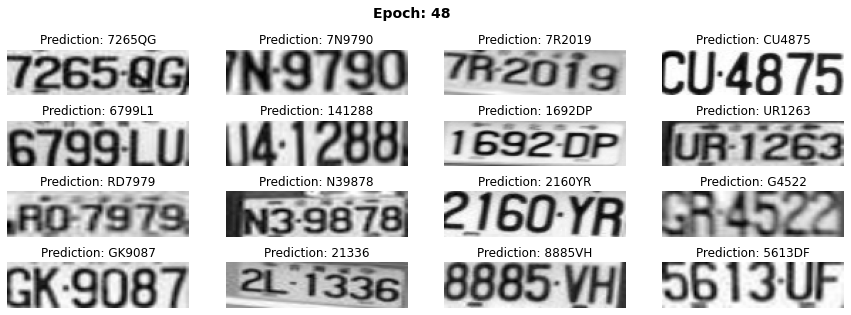

45/45 [==============================] - 9s 211ms/step - loss: 0.0243 - val_loss: 1.7690
Epoch 50/50
44/45 [============================>.] - ETA: 0s - loss: 0.0129
Epoch 50: val_loss did not improve from 1.73658


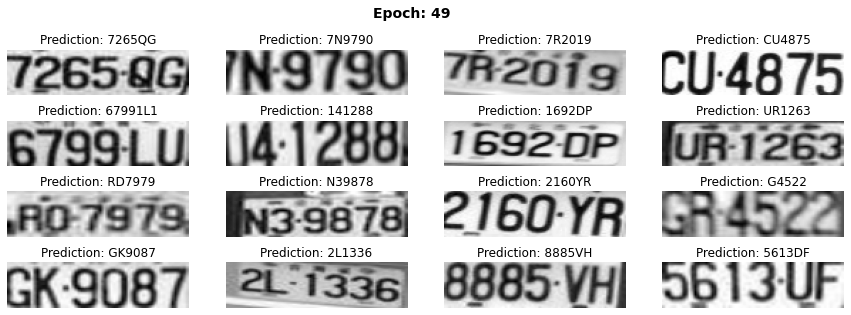

45/45 [==============================] - 9s 205ms/step - loss: 0.0128 - val_loss: 1.7568


In [ ]:
#model1_hist = train_model(model = model1,epochs=50,Accuracy_file=Acc_file, model_path=filepath)
model1_hist = train_model(model = model1, epochs=50,
                          train_data=train_dataset_modified, 
                          validation_data=val_dataset_modified,
                          Accuracy_file=Acc_file, model_path=filepath,arch_type='Modified')

In [ ]:
# capturing model loss hisyory
model1_loss_hist = pd.DataFrame(model1_hist.history)
model1_loss_hist.to_csv("/content/drive/MyDrive/ALP_Model/Recog_Output/"+model_name+".csv")

### Mode 4 - Architecture 1 LSTM

In [ ]:
def build_model_4():
    
    # input with shape of height=32 and width=128 
    img_width = 100
    img_height = 32
    inputs = Input(shape=(img_width,img_height, 1), name="image")

    labels = layers.Input(name="label", shape=(None,), dtype="float32")

    conv_1 = Conv2D(64, (3,3), activation = "relu", padding='same')(inputs)
    bn1 = BatchNormalization()(conv_1)
    pool_1 = MaxPool2D(pool_size=(2, 2),padding='same')(bn1)

   
    conv_2 = Conv2D(128, (3,3), activation = "relu", padding='same')(pool_1)
    bn2 = BatchNormalization()(conv_2)
    pool_2 = MaxPool2D(pool_size=(2, 2),padding='same')(bn2)

    
    conv_3 = Conv2D(256, (3,3), activation = "relu", padding='same')(pool_2)
    bn3 = BatchNormalization()(conv_3)

    conv_4= Conv2D(256, (3,3), activation = "relu", padding='same')(bn3)
    drop4 = Dropout(0.3)(conv_4)
    bn4 = BatchNormalization()(drop4)
    pool_4 = MaxPool2D(pool_size=(1, 2),padding='same')(bn4)
    

    conv_5 = Conv2D(512, (3,3), activation = "relu", padding='same')(pool_4)
    bn5 = BatchNormalization()(conv_5)
 

    conv_6 = Conv2D(512, (3,3), activation = "relu", padding='same')(bn5)
    drop6 = Dropout(0.3)(conv_6)
    bn6 = BatchNormalization()(drop6)
    pool_6 = MaxPool2D(pool_size=(1, 2),padding='same')(bn6)
    

    conv_7 = Conv2D(512, (2,2), activation = "relu", padding='same')(pool_6)
    drop7 = Dropout(0.25)(conv_7)
    bn7 = BatchNormalization()(drop7)
   
    
    #squeezed = Lambda(lambda x: K.squeeze(x, 1))(bn7)

     # CNN to RNN
    reshape = Reshape(target_shape=((25, 1024)))(bn7)  
    dense1 = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(reshape)
    
    # bidirectional LSTM layers with units=256
    blstm_1 = Bidirectional(CuDNNLSTM(256, return_sequences=True))(dense1)
    blstm_2 = Bidirectional(CuDNNLSTM(256, return_sequences=True))(blstm_1)

    softmax_output = Dense(len(char_list) + 1, activation = 'softmax', name="dense")(blstm_2)

    output = CTCLayer(name="ctc_loss")(labels, softmax_output)


    optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, clipnorm=1.0)

    #model to be used at training time
    model = Model(inputs=[inputs, labels], outputs=output)
    model.compile(optimizer = optimizer)

    print(model.summary())
  
    
    return model

In [ ]:
import datetime
outputdir = '/content/drive/MyDrive/ALP_Model/Recog_Output/'
curr_dt_time = datetime.datetime.now()
model_name = datetime.datetime.now().strftime(format = '%Y-%m-%d:%I:%M')+'_Original_Arch_Transposed'
#model_name
filepath = outputdir+ model_name +'.h5'
Acc_file = outputdir+model_name+'_epoch_acc.csv'
print(model_name)
print(filepath)
print(Acc_file)

2022-08-21:03:45_Original_Arch_Transposed
/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:03:45_Original_Arch_Transposed.h5
/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:03:45_Original_Arch_Transposed_epoch_acc.csv


In [ ]:
model_4= build_model_4()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 100, 32, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 100, 32, 64)  640         ['image[0][0]']                  
                                                                                                  
 batch_normalization (BatchNorm  (None, 100, 32, 64)  256        ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
table=pd.DataFrame(columns=["Name","Type","Shape"])
for layer in model_4.layers:
    table = table.append({"Name":layer.name, "Type": layer.__class__.__name__,"Shape":layer.output_shape}, ignore_index=True)

In [ ]:
table

,Name,Type,Shape
0,image,InputLayer,"[(None, 100, 32, 1)]"
1,conv2d,Conv2D,"(None, 100, 32, 64)"
2,batch_normalization,BatchNormalization,"(None, 100, 32, 64)"
3,max_pooling2d,MaxPooling2D,"(None, 50, 16, 64)"
4,conv2d_1,Conv2D,"(None, 50, 16, 128)"
5,batch_normalization_1,BatchNormalization,"(None, 50, 16, 128)"
6,max_pooling2d_1,MaxPooling2D,"(None, 25, 8, 128)"
7,conv2d_2,Conv2D,"(None, 25, 8, 256)"
8,batch_normalization_2,BatchNormalization,"(None, 25, 8, 256)"
9,conv2d_3,Conv2D,"(None, 25, 8, 256)"


In [ ]:
table.to_csv('/content/drive/MyDrive/ALP_Model/Recog_Output/Orig_Transpose_Arch.csv')

### Training Architecture 1 LSTM

In [ ]:
#validation_data=val_dataset_orig_arch
model4_hist = train_model(model = model_4, epochs=50,train_data=train_dataset_orig_arch, validation_data=val_dataset_orig_arch, Accuracy_file=Acc_file, model_path=filepath,arch_type='Original')

In [ ]:
model4_loss_hist = pd.DataFrame(model4_hist.history)
model4_loss_hist.to_csv("/content/drive/MyDrive/ALP_Model/Recog_Output/"+model_name+"_Loss_Hist.csv")

## Model - 5 Architecture 1 GRU

In [ ]:
def build_model_5():
    
    # input with shape of height=32 and width=128 
    img_width = 100
    img_height = 32
    inputs = Input(shape=(img_width,img_height, 1), name="image")

    labels = layers.Input(name="label", shape=(None,), dtype="float32")

    conv_1 = Conv2D(64, (3,3), activation = "relu", padding='same')(inputs)
    bn1 = BatchNormalization()(conv_1)
    pool_1 = MaxPool2D(pool_size=(2, 2),padding='same')(bn1)

   
    conv_2 = Conv2D(128, (3,3), activation = "relu", padding='same')(pool_1)
    bn2 = BatchNormalization()(conv_2)
    pool_2 = MaxPool2D(pool_size=(2, 2),padding='same')(bn2)

    
    conv_3 = Conv2D(256, (3,3), activation = "relu", padding='same')(pool_2)
    bn3 = BatchNormalization()(conv_3)

    conv_4= Conv2D(256, (3,3), activation = "relu", padding='same')(bn3)
    drop4 = Dropout(0.3)(conv_4)
    bn4 = BatchNormalization()(drop4)
    pool_4 = MaxPool2D(pool_size=(1, 2),padding='same')(bn4)
    

    conv_5 = Conv2D(512, (3,3), activation = "relu", padding='same')(pool_4)
    bn5 = BatchNormalization()(conv_5)
 

    conv_6 = Conv2D(512, (3,3), activation = "relu", padding='same')(bn5)
    drop6 = Dropout(0.3)(conv_6)
    bn6 = BatchNormalization()(drop6)
    pool_6 = MaxPool2D(pool_size=(1, 2),padding='same')(bn6)
    

    conv_7 = Conv2D(512, (2,2), activation = "relu", padding='same')(pool_6)
    drop7 = Dropout(0.25)(conv_7)
    bn7 = BatchNormalization()(drop7)
   
    
    #squeezed = Lambda(lambda x: K.squeeze(x, 1))(bn7)

     # CNN to RNN
    reshape = Reshape(target_shape=((25, 1024)))(bn7)  
    dense1 = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(reshape)
    
    # bidirectional LSTM layers with units=256
    blstm_1 = Bidirectional(CuDNNGRU(256, return_sequences=True))(dense1)
    blstm_2 = Bidirectional(CuDNNGRU(256, return_sequences=True))(blstm_1)

    softmax_output = Dense(len(char_list) + 1, activation = 'softmax', name="dense")(blstm_2)

    output = CTCLayer(name="ctc_loss")(labels, softmax_output)


    optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, clipnorm=1.0)

    #model to be used at training time
    model = Model(inputs=[inputs, labels], outputs=output)
    model.compile(optimizer = optimizer)

    print(model.summary())
  
    
    return model

In [ ]:
import datetime
outputdir = '/content/drive/MyDrive/ALP_Model/Recog_Output/'
curr_dt_time = datetime.datetime.now()
model_name = datetime.datetime.now().strftime(format = '%Y-%m-%d:%I:%M')+'_Original_Arch_GRU'
#model_name
filepath = outputdir+ model_name +'.h5'
Acc_file = outputdir+model_name+'_epoch_acc.csv'
print(model_name)
print(filepath)
print(Acc_file)

2022-08-27:06:58_Original_Arch_GRU
/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-27:06:58_Original_Arch_GRU.h5
/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-27:06:58_Original_Arch_GRU_epoch_acc.csv


In [ ]:
model_5= build_model_5()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 100, 32, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 100, 32, 64)  640         ['image[0][0]']                  
                                                                                                  
 batch_normalization (BatchNorm  (None, 100, 32, 64)  256        ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                            

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
table5=pd.DataFrame(columns=["Name","Type","Shape"])
for layer in model_5.layers:
    table5 = table5.append({"Name":layer.name, "Type": layer.__class__.__name__,"Shape":layer.output_shape}, ignore_index=True)
table5

,Name,Type,Shape
0,image,InputLayer,"[(None, 100, 32, 1)]"
1,conv2d,Conv2D,"(None, 100, 32, 64)"
2,batch_normalization,BatchNormalization,"(None, 100, 32, 64)"
3,max_pooling2d,MaxPooling2D,"(None, 50, 16, 64)"
4,conv2d_1,Conv2D,"(None, 50, 16, 128)"
5,batch_normalization_1,BatchNormalization,"(None, 50, 16, 128)"
6,max_pooling2d_1,MaxPooling2D,"(None, 25, 8, 128)"
7,conv2d_2,Conv2D,"(None, 25, 8, 256)"
8,batch_normalization_2,BatchNormalization,"(None, 25, 8, 256)"
9,conv2d_3,Conv2D,"(None, 25, 8, 256)"


In [ ]:
#validation_data=val_dataset_orig_arch
model5_hist = train_model(model = model_5, epochs=50,train_data=train_dataset_orig_arch, validation_data=val_dataset_orig_arch, Accuracy_file=Acc_file, model_path=filepath,arch_type='Original')

In [ ]:
model5_loss_hist = pd.DataFrame(model5_hist.history)
model5_loss_hist.to_csv("/content/drive/MyDrive/ALP_Model/Recog_Output/"+model_name+"_Loss_Hist.csv")

# Model 3 --Architecture 2 GRU

In [ ]:
def build_model3():
    
    # input with shape of height=32 and width=128 
    inputs = Input(shape=(img_height, img_width, 1), name="image")

    labels = layers.Input(name="label", shape=(None,), dtype="float32")

    conv_1 = Conv2D(32, (3,3), activation = "selu", padding='same')(inputs)
    pool_1 = MaxPool2D(pool_size=(2, 2))(conv_1)
    
    conv_2 = Conv2D(64, (3,3), activation = "selu", padding='same')(pool_1)
    pool_2 = MaxPool2D(pool_size=(2, 2))(conv_2)

    conv_3 = Conv2D(128, (3,3), activation = "selu", padding='same')(pool_2)
    conv_4 = Conv2D(128, (3,3), activation = "selu", padding='same')(conv_3)

    pool_4 = MaxPool2D(pool_size=(2, 1))(conv_4)
    
    conv_5 = Conv2D(256, (3,3), activation = "selu", padding='same')(pool_4)
    
    # Batch normalization layer
    batch_norm_5 = BatchNormalization()(conv_5)
    
    conv_6 = Conv2D(256, (3,3), activation = "selu", padding='same')(batch_norm_5)
    batch_norm_6 = BatchNormalization()(conv_6)
    pool_6 = MaxPool2D(pool_size=(2, 1))(batch_norm_6)
    
    conv_7 = Conv2D(64, (2,2), activation = "selu")(pool_6)
    
    squeezed = Lambda(lambda x: K.squeeze(x, 1))(conv_7)
    
    # bidirectional LSTM layers with units=128
    blstm_1 = Bidirectional(CuDNNGRU(128, return_sequences=True))(squeezed)
    blstm_2 = Bidirectional(CuDNNGRU(128, return_sequences=True))(blstm_1)

    softmax_output = Dense(len(char_list) + 1, activation = 'softmax', name="dense")(blstm_2)

    output = CTCLayer(name="ctc_loss")(labels, softmax_output)


    optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, clipnorm=1.0)

    #model to be used at training time
    model = Model(inputs=[inputs, labels], outputs=output)
    model.compile(optimizer = optimizer)

    print(model.summary())
       
    return model

In [ ]:
import datetime
outputdir = '/content/drive/MyDrive/ALP_Model/Recog_Output/'
curr_dt_time = datetime.datetime.now()
model_name = datetime.datetime.now().strftime(format = '%Y-%m-%d:%I:%M')+'_CRNN_Modfied_GRU_Epoch_50'
#model_name
filepath = outputdir+ model_name +'.h5'
Acc_file = outputdir+model_name+'_epoch_acc.csv'
print(model_name)
print(filepath)
print(Acc_file)

2022-08-21:05:08_CRNN_Modfied_GRU_Epoch_50
/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:05:08_CRNN_Modfied_GRU_Epoch_50.h5
/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:05:08_CRNN_Modfied_GRU_Epoch_50_epoch_acc.csv


In [ ]:
model3= build_model3()

Model: "model_51"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 32, 128, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d_7 (Conv2D)              (None, 32, 128, 32)  320         ['image[0][0]']                  
                                                                                                  
 max_pooling2d_4 (MaxPooling2D)  (None, 16, 64, 32)  0           ['conv2d_7[0][0]']               
                                                                                                  
 conv2d_8 (Conv2D)              (None, 16, 64, 64)   18496       ['max_pooling2d_4[0][0]'] 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [ ]:
table3=pd.DataFrame(columns=["Name","Type","Shape"])
for layer in model3.layers:
    table3 = table3.append({"Name":layer.name, "Type": layer.__class__.__name__,"Shape":layer.output_shape}, ignore_index=True)
table3.to_csv('/content/drive/MyDrive/ALP_Model/Recog_Output/GRU_Arch.csv')

In [ ]:
table.to_csv('/content/drive/MyDrive/ALP_Model/Recog_Output/Orig_Transpose_Arch.csv')

In [ ]:
#model3_hist = train_model(model = model3,epochs=50,Accuracy_file=Acc_file, model_path=filepath)
model3_hist = train_model(model = model3, epochs=50,
                          train_data=train_dataset_modified, 
                          validation_data=val_dataset_modified,
                          Accuracy_file=Acc_file, model_path=filepath,arch_type='Modified')

In [ ]:
model3_loss_hist = pd.DataFrame(model3_hist.history)
model3_loss_hist.to_csv("/content/drive/MyDrive/ALP_Model/Recog_Output/"+model_name+"_Loss_Hist.csv")

In [ ]:
model_name

'2022-08-21:05:08_CRNN_Modfied_GRU_Epoch_50'

### Preparing datasets for evaluation

In [ ]:
val_dataset_AC = tf.data.Dataset.from_tensor_slices((val_image_files_AC,padded_val_labels_AC))
val_dataset_LE = tf.data.Dataset.from_tensor_slices((val_image_files_LE,padded_val_labels_LE))
val_dataset_RP = tf.data.Dataset.from_tensor_slices((val_image_files_RP,padded_val_labels_RP))

In [ ]:
len(val_image_files_AC)

118

In [ ]:
val_dataset_tf_AC =  val_dataset_AC.map(
        preprocess_data_for_orig_arch, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(len(val_image_files_AC)).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
val_dataset_tf_LE =  val_dataset_LE.map(
        preprocess_data_for_orig_arch, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(len(val_image_files_LE)).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
val_dataset_tf_RP=  val_dataset_RP.map(
        preprocess_data_for_orig_arch, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(len(val_image_files_RP)).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
tf.data.experimental.cardinality(val_dataset_tf_AC)

<tf.Tensor: shape=(), dtype=int64, numpy=1>

## Model Evaluation

In [ ]:
def evaluate_recog_perf (recog_model, test_tf_dataset):

#('/content/drive/MyDrive/ALP_Model/Recog_Output/model_init_2022-08-0616_10_52.634579_CRNN_Best.h5'

  model = tf.keras.models.load_model(recog_model,custom_objects={'CTCLayer': CTCLayer})

  prediction_model = keras.models.Model(
    model.get_layer(name="image").input, model.get_layer(name="dense").output
  )  
  for batch in test_tf_dataset.take(1):

    batch_images = batch["image"]
    batch_labels = batch["label"]

    preds = prediction_model.predict(batch_images)
    pred_texts = ctc_decoder(preds)
    
    plate_labels = []
    for label in batch_labels:
        #label = tf.strings.reduce_join(num_to_char(label)).numpy().decode("utf-8")
        lbl_lst = label.numpy()
        label = decode_label_to_text(lbl_lst)
        plate_labels.append(label)

  plate_acc, letter_acc = evaluate_accuracies(plate_labels, pred_texts)

  return plate_acc, letter_acc

### LSTM model - Orignal Arch

In [ ]:
recog_model ="/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:03:45_Original_Arch_Transposed.h5"
evaluate_recog_perf(recog_model,val_dataset_tf_AC)

(84.75, 94.63)

In [ ]:
evaluate_recog_perf(recog_model,val_dataset_tf_LE)

(95.29, 98.73)

In [ ]:
evaluate_recog_perf(recog_model,val_dataset_tf_RP)

(85.07, 96.27)

In [ ]:
val_dataset_orig_arch_for_test =  val_dataset.map(
        preprocess_data_for_orig_arch, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(len(val_image_files)).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
evaluate_recog_perf(recog_model,val_dataset_orig_arch_for_test)

(89.86, 96.9)

### GRU model - Orignal Arch

In [ ]:
recog_model_original_GRU ="/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-27:06:58_Original_Arch_GRU.h5"
evaluate_recog_perf(recog_model_original_GRU,val_dataset_orig_arch_for_test)

(89.86, 97.42)

In [ ]:
evaluate_recog_perf(recog_model_original_GRU,val_dataset_tf_AC)

(85.59, 96.19)

In [ ]:
evaluate_recog_perf(recog_model_original_GRU,val_dataset_tf_LE)

(94.12, 99.02)

In [ ]:
evaluate_recog_perf(recog_model_original_GRU,val_dataset_tf_RP)

(86.57, 95.53)

In [ ]:
val_dataset_mdfd_arch_for_test =  val_dataset.map(
        preprocess_data, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(len(val_image_files)).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
val_dataset_tf_AC_Mdfd =  val_dataset_AC.map(
        preprocess_data, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(len(val_image_files_AC)).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
val_dataset_tf_LE_Mdfd =  val_dataset_LE.map(
        preprocess_data, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(len(val_image_files_LE)).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)    
val_dataset_tf_RP_Mdfd=  val_dataset_RP.map(
        preprocess_data, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(len(val_image_files_RP)).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

## LSTM Model - Moddified Arch

In [ ]:
recog_model_lstm ="/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:04:53_CRNN_Modified_LSTM.h5"

In [ ]:
evaluate_recog_perf(recog_model_lstm,val_dataset_tf_AC_Mdfd)

(71.19, 91.53)

In [ ]:
evaluate_recog_perf(recog_model_lstm,val_dataset_tf_LE_Mdfd)

(78.24, 92.03)

In [ ]:
evaluate_recog_perf(recog_model_lstm,val_dataset_mdfd_arch_for_test)

(70.42, 90.18)

In [ ]:
evaluate_recog_perf(recog_model_lstm,val_dataset_tf_RP_Mdfd)

## GRU Model - Moddified Arch

In [ ]:
recog_model_GRU ="/content/drive/MyDrive/ALP_Model/Recog_Output/2022-08-21:05:08_CRNN_Modfied_GRU_Epoch_50.h5"

In [ ]:
evaluate_recog_perf(recog_model_GRU,val_dataset_tf_AC_Mdfd)

(82.2, 94.36)

In [ ]:
evaluate_recog_perf(recog_model_GRU,val_dataset_tf_LE_Mdfd)

(88.24, 95.89)

In [ ]:
evaluate_recog_perf(recog_model_GRU,val_dataset_tf_RP_Mdfd)

(62.69, 84.62)

In [ ]:
evaluate_recog_perf(recog_model_GRU,val_dataset_mdfd_arch_for_test)

(81.41, 93.26)